## 1. Descriptive Statistics (15 poin)
Gunakan function info dan describe pada dataset final project kalian. Tuliskan hasil
observasinya, seperti:
- A. Apakah ada kolom dengan tipe data kurang sesuai, atau nama kolom dan isinya
kurang sesuai?
- B. Apakah ada kolom yang memiliki nilai kosong? Jika ada, apa saja?
- C. Apakah ada kolom yang memiliki nilai summary agak aneh?
(min/mean/median/max/unique/top/freq)

Untuk masing-masing jenis observasi, tuliskan juga jika tidak ada masalah,
misal untuk A: “Semua tipe data sudah sesuai”


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving E Commerce Dataset.xlsx to E Commerce Dataset (1).xlsx


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from matplotlib import rcParams
rcParams['figure.figsize'] = 12, 4
rcParams['lines.linewidth'] = 2
rcParams['xtick.labelsize'] = 'large'
rcParams['ytick.labelsize'] = 'large'

In [ ]:
import pandas as pd
data_e_com = pd.read_excel('E Commerce Dataset (1).xlsx')
data_e_com.head(5)

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60


In [ ]:
data_e_com.columns.values

array(['CustomerID', 'Churn', 'Tenure', 'PreferredLoginDevice',
       'CityTier', 'WarehouseToHome', 'PreferredPaymentMode', 'Gender',
       'HourSpendOnApp', 'NumberOfDeviceRegistered', 'PreferedOrderCat',
       'SatisfactionScore', 'MaritalStatus', 'NumberOfAddress',
       'Complain', 'OrderAmountHikeFromlastYear', 'CouponUsed',
       'OrderCount', 'DaySinceLastOrder', 'CashbackAmount'], dtype=object)

In [ ]:
data_e_com.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

### A. Apakah ada kolom dengan tipe data kurang sesuai, atau nama kolom dan isinya kurang sesuai?

**Terdapat beberapa variabel yang tipe data kurang sesuai seperti:**

- Churn = int64 --> Bolean
- CityTier = Int --> Object
- SatisfactionScore = Int
- CoupunUsed = float64 --> int
- OrderCount = float64 --> int
- DaySinceLastOrder = float64 --> int
- Complain = Float --> Bolean

In [ ]:
data_e_com.isna().sum()

CustomerID                       0
Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

### B. Apakah ada kolom yang memiliki nilai kosong? Jika ada, apa saja?

->Ada, yaitu Tenure, WarehouseToHome, HourSpendOnApp, OrderAmountHikeFromlastYear, CoupunUsed, OrderCount, DaySinceLastOrder.


In [ ]:
# Pisahkan Categorical & Numerical

cats = []
nums = []

for i in data_e_com.columns:
  if data_e_com[i].dtype == 'object':
    cats.append(i)
  else:
    nums.append(i)

print('Categorical =', cats)
print('Numerical =', nums)

Categorical = ['PreferredLoginDevice', 'PreferredPaymentMode', 'Gender', 'PreferedOrderCat', 'MaritalStatus']
Numerical = ['CustomerID', 'Churn', 'Tenure', 'CityTier', 'WarehouseToHome', 'HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore', 'NumberOfAddress', 'Complain', 'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount']


In [ ]:
# Describe variabel numerical
data_e_com[nums].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
CustomerID,5630.0,52815.500000,1625.385339,50001.0,51408.25,52815.50,54222.7500,55630.00
Churn,5630.0,0.168384,0.374240,0.0,0.00,0.00,0.0000,1.00
Tenure,5366.0,10.189899,8.557241,0.0,2.00,9.00,16.0000,61.00
CityTier,5630.0,1.654707,0.915389,1.0,1.00,1.00,3.0000,3.00
WarehouseToHome,5379.0,15.639896,8.531475,5.0,9.00,14.00,20.0000,127.00
HourSpendOnApp,5375.0,2.931535,0.721926,0.0,2.00,3.00,3.0000,5.00
NumberOfDeviceRegistered,5630.0,3.688988,1.023999,1.0,3.00,4.00,4.0000,6.00
SatisfactionScore,5630.0,3.066785,1.380194,1.0,2.00,3.00,4.0000,5.00
NumberOfAddress,5630.0,4.214032,2.583586,1.0,2.00,3.00,6.0000,22.00
Complain,5630.0,0.284902,0.451408,0.0,0.00,0.00,1.0000,1.00


>Ada kejanggalan pada data Numerical, diantaranya:

WarehouseToHome: Kolom ini memiliki nilai maksimum 127, yang jauh lebih besar dari nilai rata-rata (15.64) dan median (14). Ini menunjukkan adanya outlier atau kesalahan dalam data.

NumberOfAddress: Kolom ini memiliki nilai maksimum 22, yang juga jauh lebih besar dari nilai rata-rata (4.21) dan median (3). Ini juga menunjukkan adanya outlier atau kesalahan dalam data.

CouponUsed: Kolom ini memiliki nilai maksimum 16, yang juga jauh lebih besar dari nilai rata-rata (1.75) dan median (1). Ini juga menunjukkan adanya outlier atau kesalahan dalam data.

OrderCount: Kolom ini memiliki nilai maksimum 16, yang juga jauh lebih besar dari nilai rata-rata (3.01) dan median (2). Ini juga menunjukkan adanya outlier atau kesalahan dalam data.

In [ ]:
# Describe variabel categorical
data_e_com[cats].describe()

,PreferredLoginDevice,PreferredPaymentMode,Gender,PreferedOrderCat,MaritalStatus
count,5630,5630,5630,5630,5630
unique,3,7,2,6,3
top,Mobile Phone,Debit Card,Male,Laptop & Accessory,Married
freq,2765,2314,3384,2050,2986


In [ ]:
# See unique values from PreferredLoginDevice
data_e_com['PreferredLoginDevice'].unique()

array(['Mobile Phone', 'Phone', 'Computer'], dtype=object)

Pada variabel PreferredLoginDevice terdapat value yang ambigu antara Mobile Phone dengan Phone. Perlu dilakukan preprocessing lebih lanjut

In [ ]:
# See unique values from PreferredPaymentMode
data_e_com['PreferredPaymentMode'].unique()

array(['Debit Card', 'UPI', 'CC', 'Cash on Delivery', 'E wallet', 'COD',
       'Credit Card'], dtype=object)

Pada variabel PreferredPaymentMode terdapat value yang ambigu antara CC dengan Credit Card, dan Cash On Delivery dengan COD. Perlu dilakukan preprocessing lebih lanjut.

In [ ]:
# See unique values from Gender
data_e_com['Gender'].unique()

array(['Female', 'Male'], dtype=object)

In [ ]:
# See unique values from MaritalStatus
data_e_com['MaritalStatus'].unique()

array(['Single', 'Divorced', 'Married'], dtype=object)

In [ ]:
# See unique values from PreferedOrderCat
data_e_com['PreferedOrderCat'].unique()

array(['Laptop & Accessory', 'Mobile', 'Mobile Phone', 'Others',
       'Fashion', 'Grocery'], dtype=object)

Pada variabel PreferredOrderCat terdapat value yang ambigu antara Mobile Phone dengan Phone. Perlu dilakukan preprocessing lebih lanjut

In [ ]:
# MelihMelihatat value count variabel numerical
for col in nums:
    percent = round(data_e_com[col].value_counts()*100/len(data_e_com[col]),2)
    print(f'''Value count kolom {col}:''')
    print(data_e_com[col].value_counts())
    print('')
    print('Presentase :\n',percent)
    print('---'*10)
    print()

Value count kolom CustomerID:
50001    1
53751    1
53759    1
53758    1
53757    1
        ..
51876    1
51875    1
51874    1
51873    1
55630    1
Name: CustomerID, Length: 5630, dtype: int64

Presentase :
 50001    0.02
53751    0.02
53759    0.02
53758    0.02
53757    0.02
         ... 
51876    0.02
51875    0.02
51874    0.02
51873    0.02
55630    0.02
Name: CustomerID, Length: 5630, dtype: float64
------------------------------

Value count kolom Churn:
0    4682
1     948
Name: Churn, dtype: int64

Presentase :
 0    83.16
1    16.84
Name: Churn, dtype: float64
------------------------------

Value count kolom Tenure:
1.0     690
0.0     508
8.0     263
9.0     247
7.0     221
10.0    213
5.0     204
4.0     203
3.0     195
11.0    194
6.0     183
12.0    182
13.0    181
14.0    176
2.0     167
15.0    159
16.0    149
19.0    140
18.0    123
20.0    109
17.0    106
23.0     89
21.0     84
22.0     76
24.0     75
28.0     70
30.0     66
27.0     66
26.0     60
25.0     59
29

In [ ]:
# Melihat value count variable categorical
for col in cats:
    percent = round(data_e_com[col].value_counts()*100/len(data_e_com[col]),2)
    print(f'''Value count kolom {col}:''')
    print(data_e_com[col].value_counts())
    print('')
    print('Presentase :\n',percent)
    print('---'*10)
    print()

Value count kolom PreferredLoginDevice:
Mobile Phone    2765
Computer        1634
Phone           1231
Name: PreferredLoginDevice, dtype: int64

Presentase :
 Mobile Phone    49.11
Computer        29.02
Phone           21.87
Name: PreferredLoginDevice, dtype: float64
------------------------------

Value count kolom PreferredPaymentMode:
Debit Card          2314
Credit Card         1501
E wallet             614
UPI                  414
COD                  365
CC                   273
Cash on Delivery     149
Name: PreferredPaymentMode, dtype: int64

Presentase :
 Debit Card          41.10
Credit Card         26.66
E wallet            10.91
UPI                  7.35
COD                  6.48
CC                   4.85
Cash on Delivery     2.65
Name: PreferredPaymentMode, dtype: float64
------------------------------

Value count kolom Gender:
Male      3384
Female    2246
Name: Gender, dtype: int64

Presentase :
 Male      60.11
Female    39.89
Name: Gender, dtype: float64
-------------

### C. Apakah ada kolom yang memiliki nilai summary agak aneh?

**->Ada kejanggalan pada data Numerical, diantaranya:**
- WarehouseToHome: Kolom ini memiliki nilai maksimum 127, yang jauh lebih besar dari nilai rata-rata (15.64) dan median (14). Ini menunjukkan adanya outlier atau kesalahan dalam data.

- NumberOfAddress: Kolom ini memiliki nilai maksimum 22, yang juga jauh lebih besar dari nilai rata-rata (4.21) dan median (3). Ini juga menunjukkan adanya outlier atau kesalahan dalam data.

- CouponUsed: Kolom ini memiliki nilai maksimum 16, yang juga jauh lebih besar dari nilai rata-rata (1.75) dan median (1). Ini juga menunjukkan adanya outlier atau kesalahan dalam data.

- OrderCount: Kolom ini memiliki nilai maksimum 16, yang juga jauh lebih besar dari nilai rata-rata (3.01) dan median (2). Ini juga menunjukkan adanya outlier atau kesalahan dalam data.

**->Ada kejanggalan pada data Object, diantaranya:**

- Pada variabel PreferredLoginDevice terdapat value yang ambigu antara Mobile Phone dengan Phone. Perlu dilakukan preprocessing lebih lanjut

- Pada variabel PreferredPaymentMode terdapat value yang ambigu antara CC dengan Credit Card, dan Cash On Delivery dengan COD. Perlu dilakukan preprocessing lebih lanjut.

- Pada variabel PreferredOrderCat terdapat value yang ambigu antara Mobile Phone dengan Phone. Perlu dilakukan preprocessing lebih lanjut.

# 2. Univariate Analysis (25 poin)
Gunakan visualisasi untuk melihat distribusi masing-masing kolom (feature maupun
target). Tuliskan hasil observasinya, misalnya jika ada suatu kolom yang distribusinya
menarik (misal skewed, bimodal, ada outlier, ada nilai yang mendominasi, kategorinya
terlalu banyak, dsb). Jelaskan juga apa yang harus di-follow up saat data pre-processing

### Unvariate Analysis

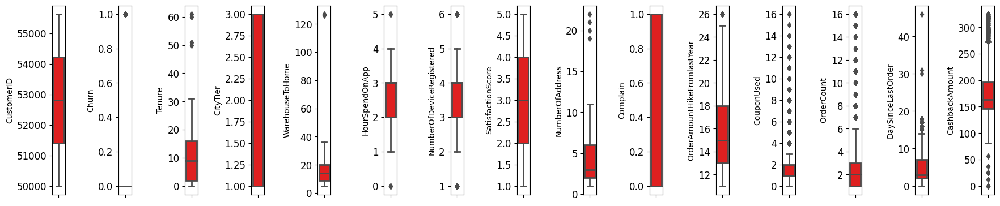

In [ ]:
# Membuat diagram boxplot
plt.figure(figsize=(18,4))

for i in range (0, len(nums)):
    plt.subplot(1, len(nums), i+1)
    sns.boxplot(y=data_e_com[nums[i]], color='red', orient='v')
    plt.tight_layout(pad = 2)

#### **Hasil Observasi**
Hasil yang diperoleh pada diagram diatas terdapat fitur-fitur yang terdistribusi normal seperti CustomerID, CityTier, HourSpendOnApp, NumberOfDeviceRegistered, SatisfactionScore, Complain dan CashbackAmount.

Terdapat juga outlier yang perlu dilakukan proses pre-processing lebih lanjut.
Outlier berpengaruh Terhadap tingkat churn oleh karena itu outlier sebaiknya dihapus.

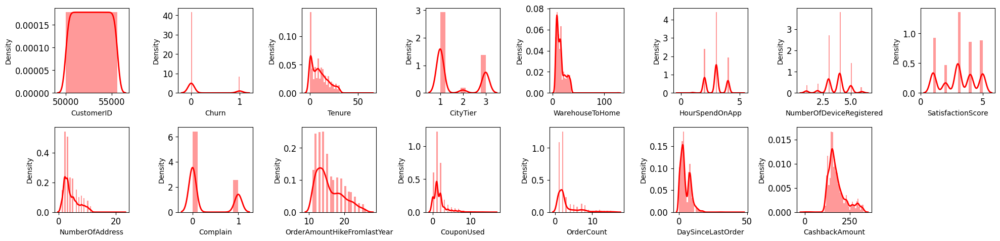

In [ ]:
# Membuat diagram kdeplot untuk melihat distribusi data
plt.figure(figsize=(20, 5))
for i in range(0, len(nums)):
    plt.subplot(2, 8, i+1)
    sns.distplot(data_e_com[nums[i]], color='red')
    plt.tight_layout(pad = 1.5)

#### **Hasil Observasi**
Dari diagram diatas terdapat beberapa insight yaitu:

- Distribusi skew positif ditandai dengan nilai Mean > Median. Skew positive juga disebabkan adanya outlier, ini yang mengakibatkan nilai rata-rata nya melebihi rata-rata yang normal.

- Adanya bimodal ini terjadi karena dua variabel satu sama lain, dapat dilihat ada 2 kategori yang ada, seperti yang terlihat pada diagram complain dan churn.

- Dapat dilihat pada diagram complain juga terdapat banyak yang complain ditandai dengan puncak di angka 1 yang lebih besar dari 0.

- Terdapat beberapa fitur yang menjadi perhatian seperti Tenure, CouponUsed, DaySinceLastOrder, CashbackAmount

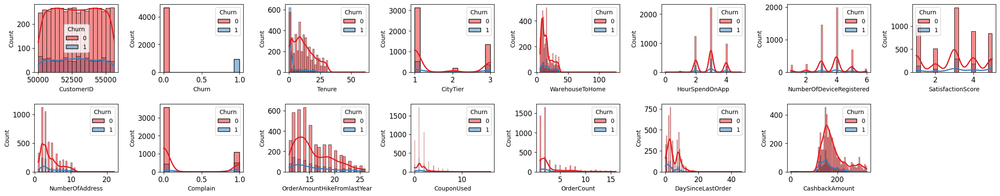

In [ ]:
# KDE plot dengan meng-highlight Churn sebagai variabel target
plt.figure(figsize=(24, 5))
for i in range(0, len(nums)):
    plt.subplot(2, 8, i+1)
    sns.histplot(data=data_e_com, x=data_e_com[nums[i]], hue="Churn", kde=True, palette="Set1")
    plt.tight_layout(pad=2)

plt.show()

#### **Hasil Observasi**

- Rata-rata pelanggan menghabiskan waktu selama 3 jam dalam menggunakan aplikasi e-commerce.

- Masih banyak pelanggan yang tidak menggunakan kupon dalam berbelanja.

- Pelanggan dengan lokasi lebih dekat dengan gudang (< 15 km) labih mendominasi.

- Jumlah pelanggan yang melakukan komplain cukup banyak sekitar 1000 orang. Hal ini harus menjadi perhatian dalam perkembangan bisnis ke depannya.

- Dengan meng-highlight Churn sebagai variabel target, dapat terlihat persebaran data pelanggan mana yang churn. Dari diagram diatas dapat dilihat proporsi pelanggan yang churn tiap masing-masing fitur.

- Variabel Tenure menjadi perhatian karena banyaknya pelanggan churn pada tenure < 3 bulan.

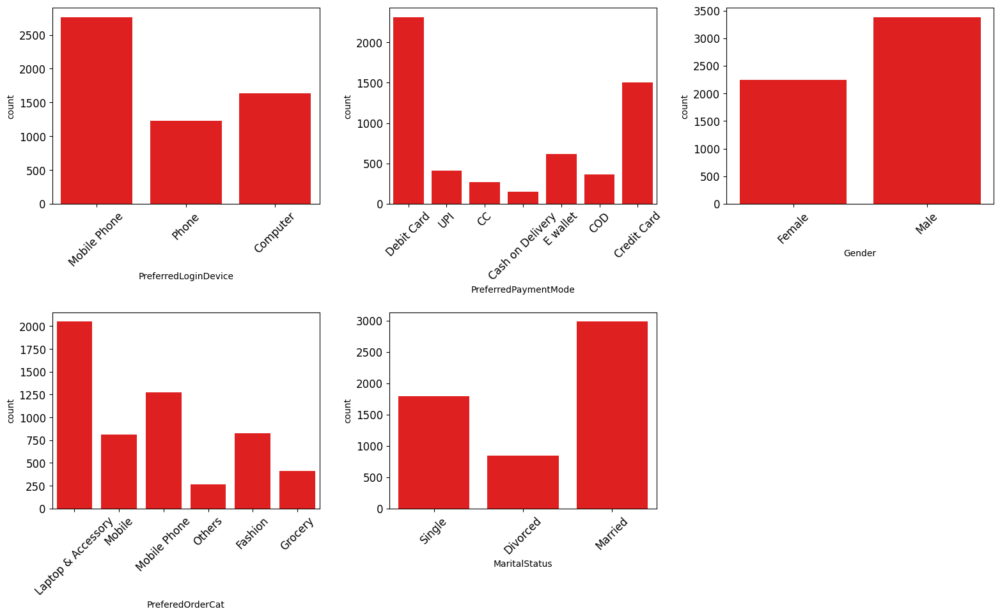

In [ ]:
plt.figure(figsize=(16, 10))
for i in range(0, len(cats[0:])):
    plt.subplot(2, 3, i + 1)
    sns.countplot(data=data_e_com, x=cats[0:][i], color='red')
    plt.xticks(rotation=45)
    plt.tight_layout(pad=2)

#### **Hasil Observasi**

Hampir 50% pelanggan didominasi oleh pelanggan yang bertransaksi melalui aplikasi mobile phone. Metode pembayaran secara Debit Card lebih disukai oleh pelanggan. Pelanggan lebih banyak didominasi oleh Pria dibanding wanita. Hal ini dapat terlihat pada penjualan kategori Laptop & Accessory mengungguli kategori fashion.

Pada variabel PreferredPaymentMode terdapat value yang ambigu antara Cash On Delivery dan COD, erta CC dan Creadit card , keuian Phone dengan Mobile phone. Menurut kami perlu dilakukan tindakan pre-processing lebih lanjut.

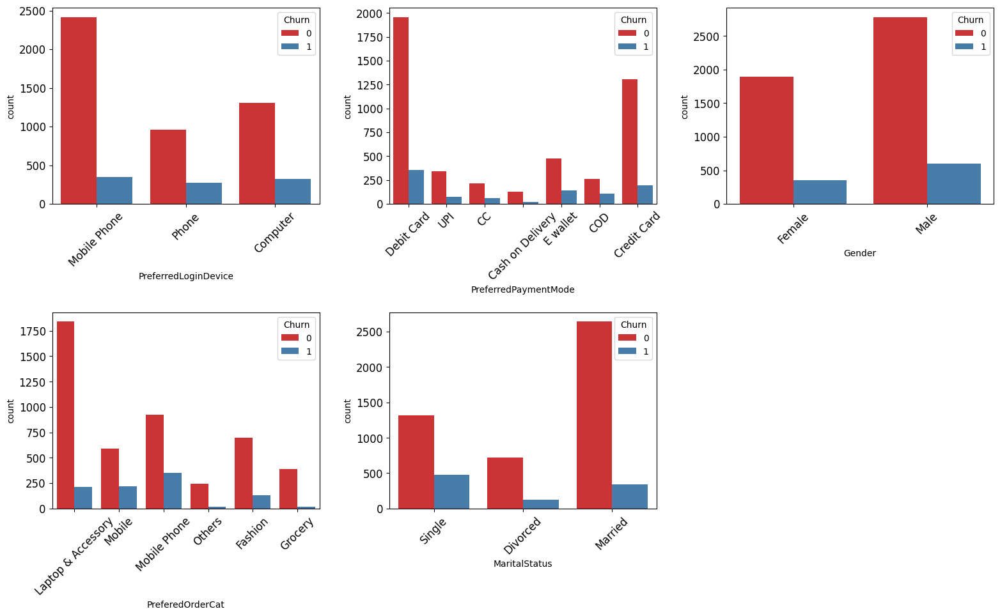

In [ ]:
# Countplot dengan meng-highlight "Churn" sebagai variabel target
plt.figure(figsize=(16,10))
for i in range (0, len(cats[0:])):
    plt.subplot(2, 3, i+1)
    sns.countplot(data=data_e_com, x=data_e_com[cats[0:][i]], hue='Churn', orient='h', palette="Set1")
    plt.tick_params(axis='x', rotation=45)
    plt.tight_layout(pad=2)

#### **Hasil Observasi**
Persebaran pelanggan churn masih sangat kecil dibanding pelanggan yang tidak melakukan churn. Perlu dilakukan analisa korelasi antara variable numerikal & kategorikal untuk melihat variabel apa yang mempengaruhi tingkat churn.

# 3. Multivariate Analysis (15 poin)
Lakukan multivariate analysis (seperti correlation heatmap dan category plots, sesuai yang
diajarkan di kelas). Tuliskan hasil observasinya, seperti:
A. Bagaimana korelasi antara masing-masing feature dan label. Kira-kira feature mana
saja yang paling relevan dan harus dipertahankan?
B. Bagaimana korelasi antar-feature, apakah ada pola yang menarik? Apa yang perlu
dilakukan terhadap feature itu?
* Tuliskan juga jika memang tidak ada feature yang saling berkorelas

### Multivariate Analysis

<Axes: >

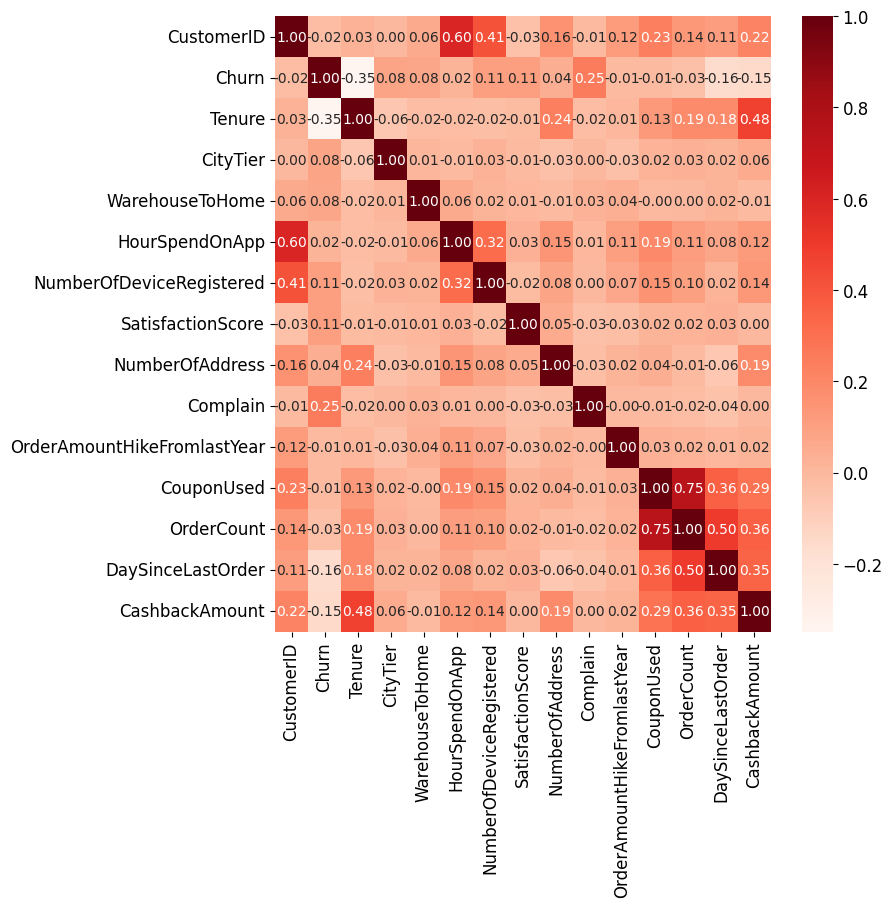

In [ ]:
# Correlation Heatmap (Numeric)
plt.figure(figsize=(8,8))
sns.heatmap(data_e_com.corr(), cmap='Reds', annot=True, fmt='.2f')

Dari heatmap di atas dapat diperoleh adanya korelasi fitur dengan target, dimana targetnya adalah churn. Fitur yang memiliki korelasi tinggi dengan target churn adalah Tenure -0,35. Dimana ini termasuk korelasi negatif, artinya nilai tenure semakin besar maka tingkat churn rendah. Selain itu, korelasi fitur lain yang cukup besar yaitu antara churn dengan complain 0,25. Dimana ini termasuk korelasi positif, artinya semakin besar nilai complain semakin besar tingkat churn. Sehingga, fitur yang relevan dan harus dipertahankan adalah fitur tenure dan complain.

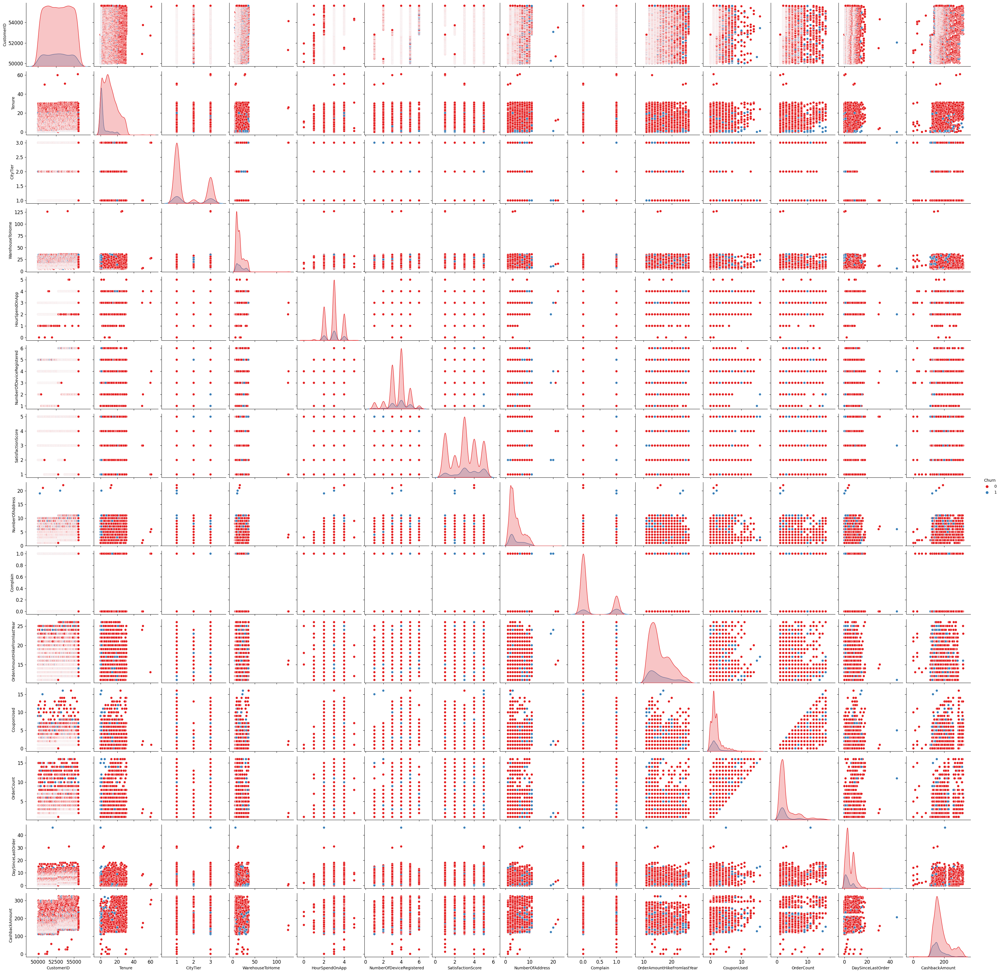

In [ ]:
# Pair Plots (Numeric)
sns.pairplot(data_e_com, diag_kind='kde', hue='Churn', palette="Set1")

Dari pair plots di atas pemisahan scatter plot kurang terlihat dengan bagus, sehingga cukup sulit untuk mendapatkan korelasi fitur yang akurat.

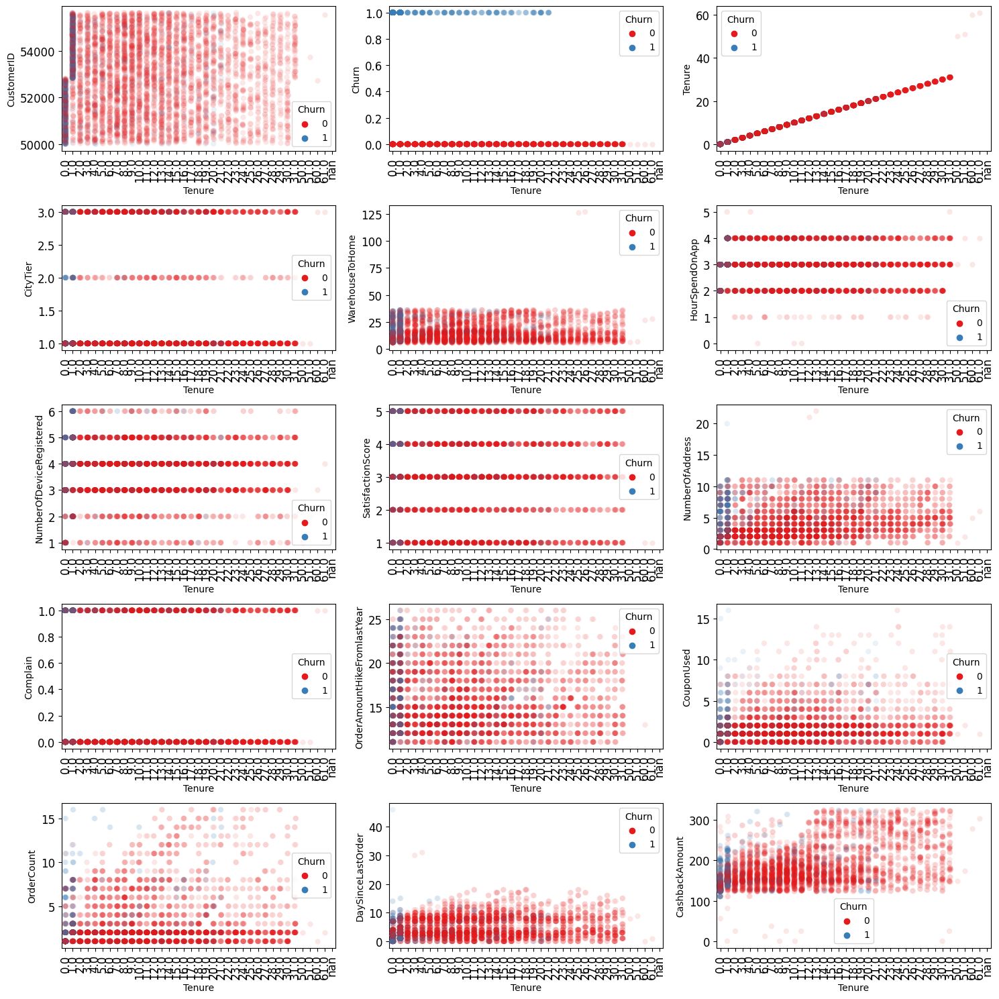

In [ ]:
#Category Plots (Categorical-Numeric)
fig = plt.figure(figsize=(15,15))
for i in range(0,len(nums[0:])):
  ax = fig.add_subplot(5, 3, i+1)
  sns.stripplot(ax=ax, data=data_e_com, x='Tenure', y=nums[i], hue='Churn', size=6, alpha=0.1, palette="Set1")
  plt.tick_params(axis='x', rotation=90)
  plt.tight_layout()

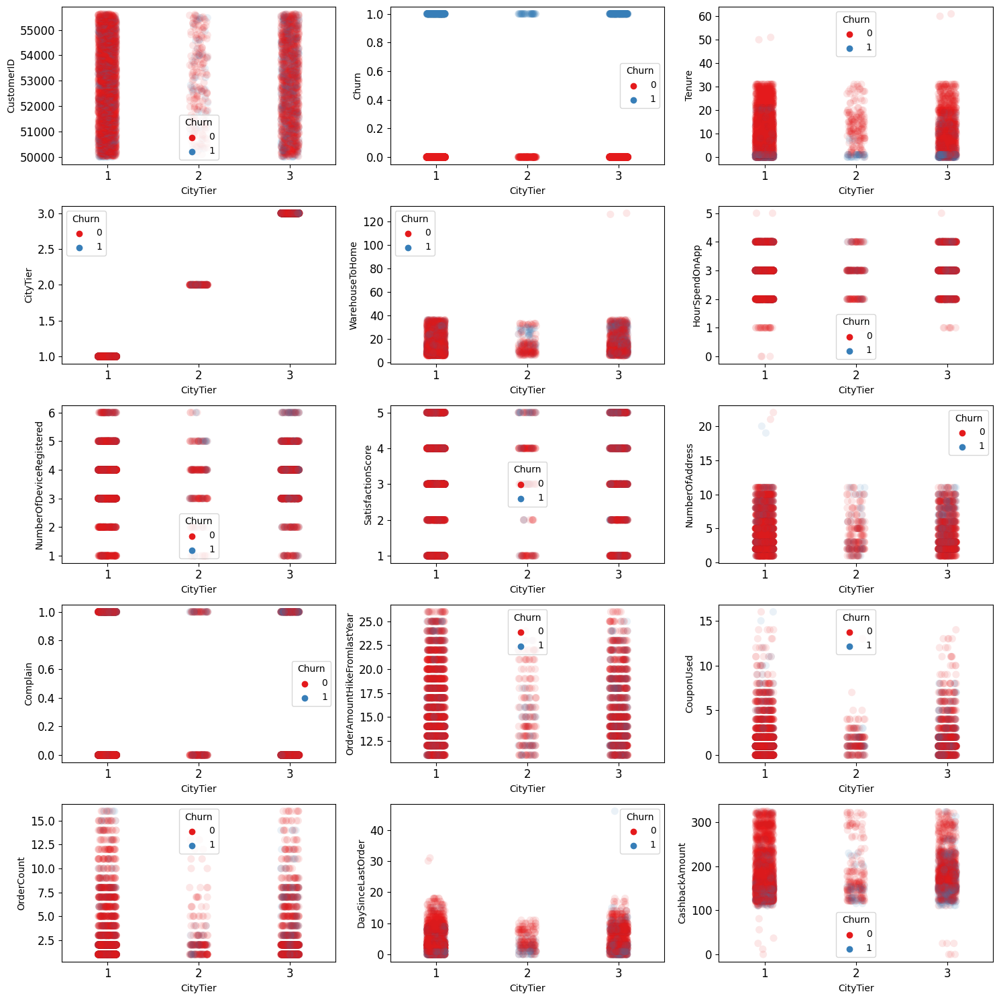

In [ ]:
#Category Plots (Categorical-Numeric)
fig = plt.figure(figsize=(15,15))
for i in range(0,len(nums[0:])):
  ax = fig.add_subplot(5, 3, i+1)
  sns.stripplot(ax=ax, data=data_e_com, x='CityTier', y=nums[i], hue='Churn', size=8, alpha=0.1, palette="Set1")
  plt.tight_layout()

**Hasil Observasi** Korelasi kategori CityTier dengan semua numerical dapat dilihat bahwa tidak ada yang berpengaruh, karena terlihat rata stripplotnya.

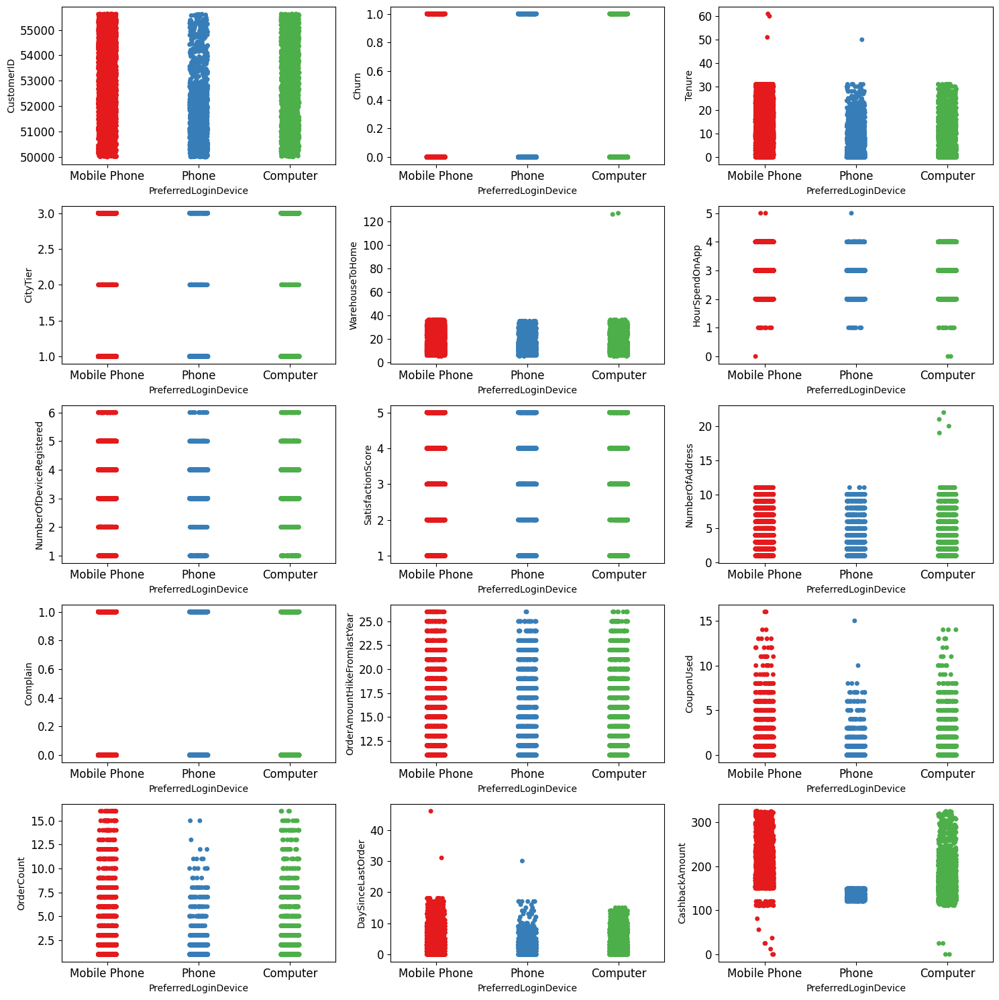

In [ ]:
#Category Plots (Categorical-Numeric)
fig = plt.figure(figsize=(15,15))
for i in range(0,len(nums[0:])):
  ax = fig.add_subplot(5, 3, i+1)
  sns.stripplot(ax=ax, data=data_e_com, x='PreferredLoginDevice', y=nums[i], palette="Set1")
  plt.tight_layout()

**Hasil Observasi** Korelasi kategori PreferredLoginDevice dengan semua numerical dapat dilihat bahwa tidak ada yang berpengaruh, karena terlihat rata stripplotnya.

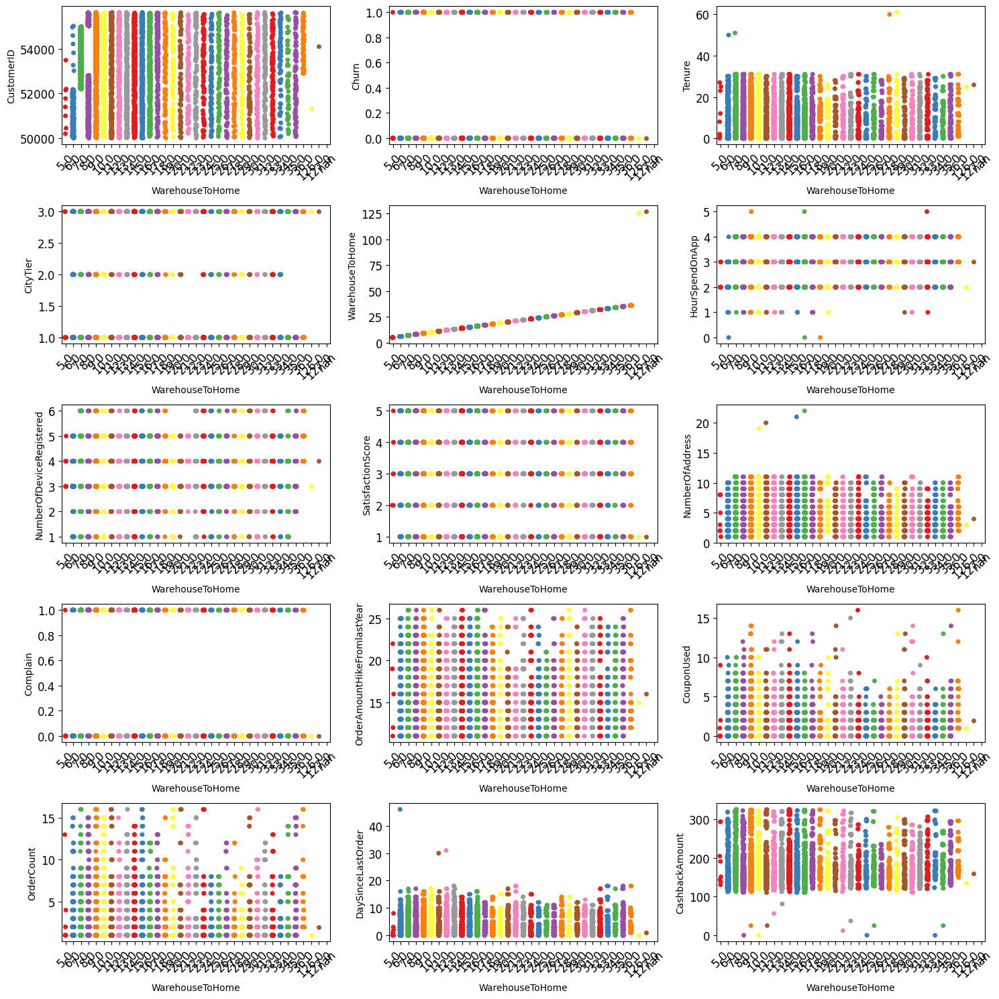

In [ ]:
#Category Plots (Categorical-Numeric)
fig = plt.figure(figsize=(15,15))
for i in range(0,len(nums[0:])):
  ax = fig.add_subplot(5, 3, i+1)
  sns.stripplot(ax=ax, data=data_e_com, x='WarehouseToHome', y=nums[i], palette="Set1")
  plt.tick_params(axis='x', rotation=45)
  plt.tight_layout()

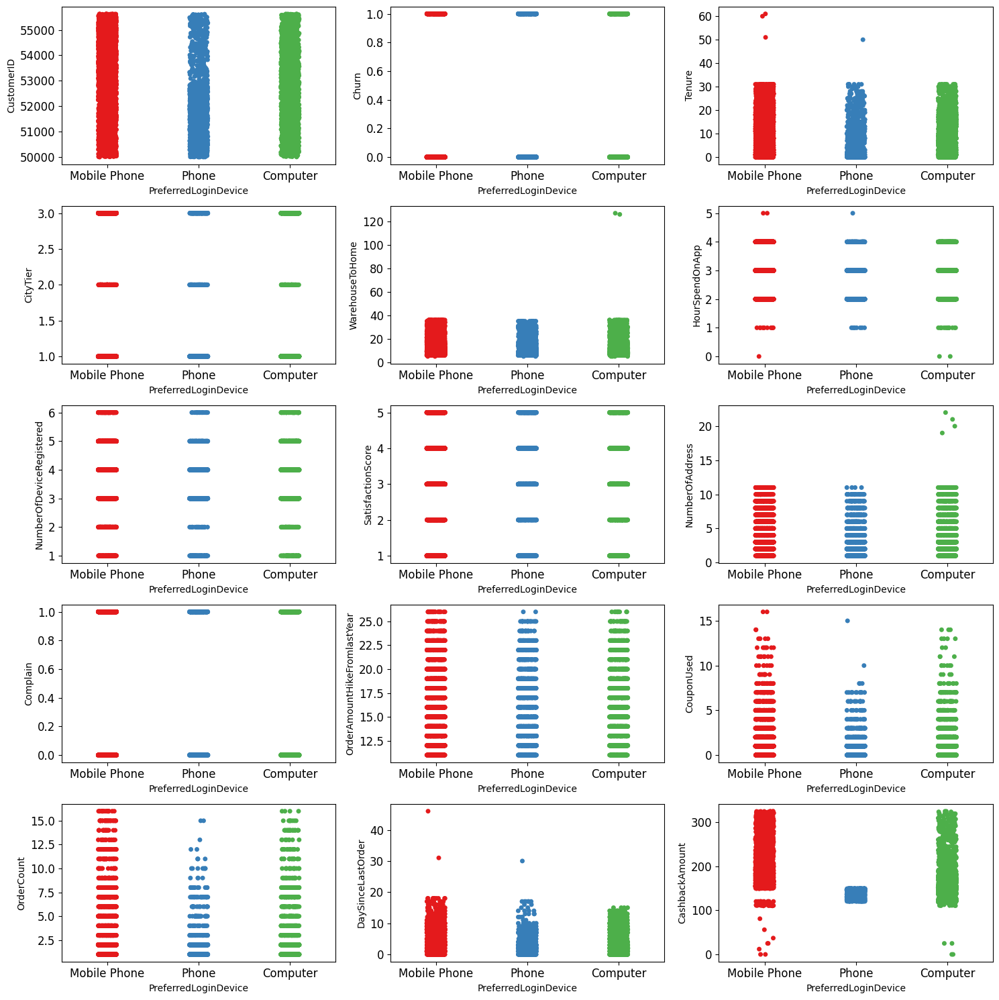

In [ ]:
#Category Plots (Categorical-Numeric)
fig = plt.figure(figsize=(15,15))
for i in range(0,len(nums[0:])):
  ax = fig.add_subplot(5, 3, i+1)
  sns.stripplot(ax=ax, data=data_e_com, x='PreferredLoginDevice', y=nums[i], palette="Set1")
  plt.tight_layout()

**Hasil Observasi** Korelasi kategori preferred login device dengan semua numerical dapat dilihat bahwa tidak ada yang berpengaruh, karena terlihat rata stripplotnya. Tetapi ada dua korelasi fitur caschback ampount dan Coupon Used dengan preferred login device yaitu terlihat yang menggunakan phone lebih sedikit dibandingkan yang lainnya.

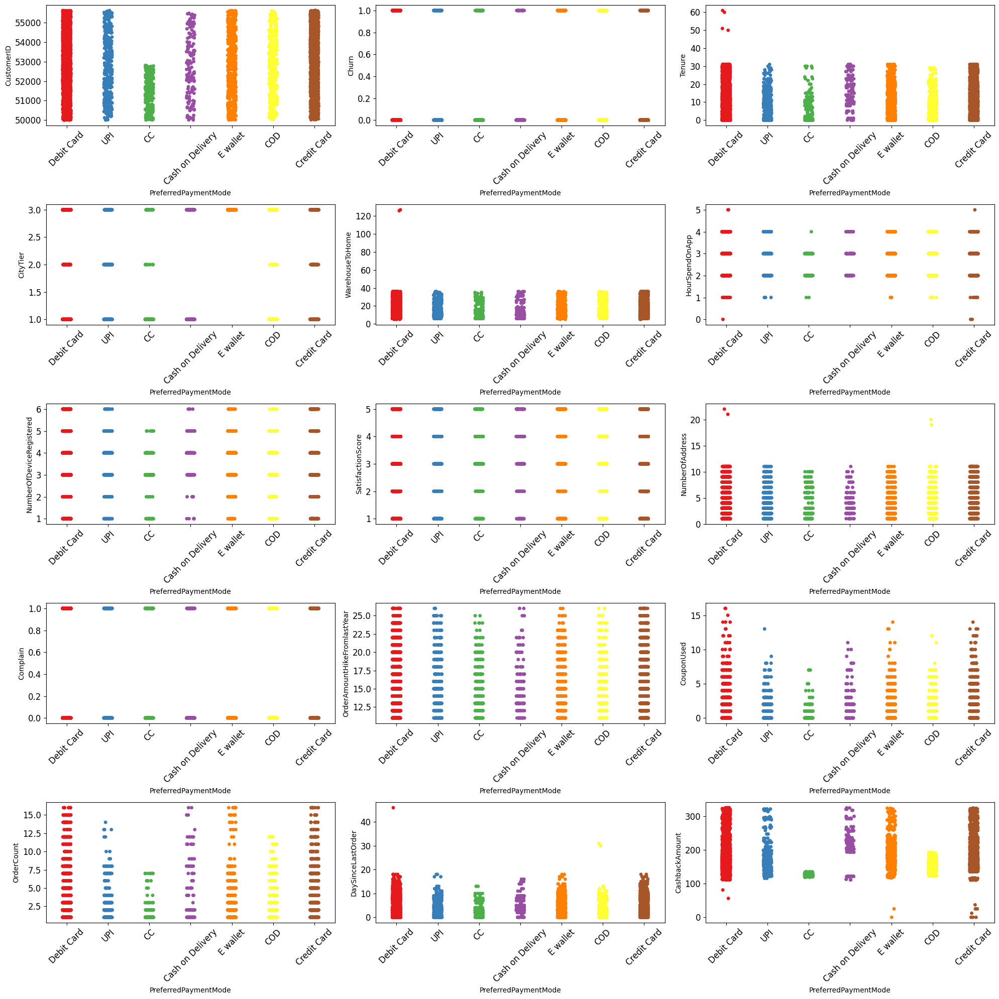

In [ ]:
#Category Plots (Categorical-Numeric)
fig = plt.figure(figsize=(20,20))
for i in range(0,len(nums[0:])):
  ax = fig.add_subplot(5, 3, i+1)
  sns.stripplot(ax=ax, data=data_e_com, x='PreferredPaymentMode', y=nums[i], palette="Set1")
  plt.tick_params(axis='x', rotation=45)
  plt.tight_layout()

**Hasil Observasi** Korelasi kategori preferred payment method dengan semua numerical dapat dilihat bahwa tidak ada yang berpengaruh, karena terlihat rata stripplotnya.

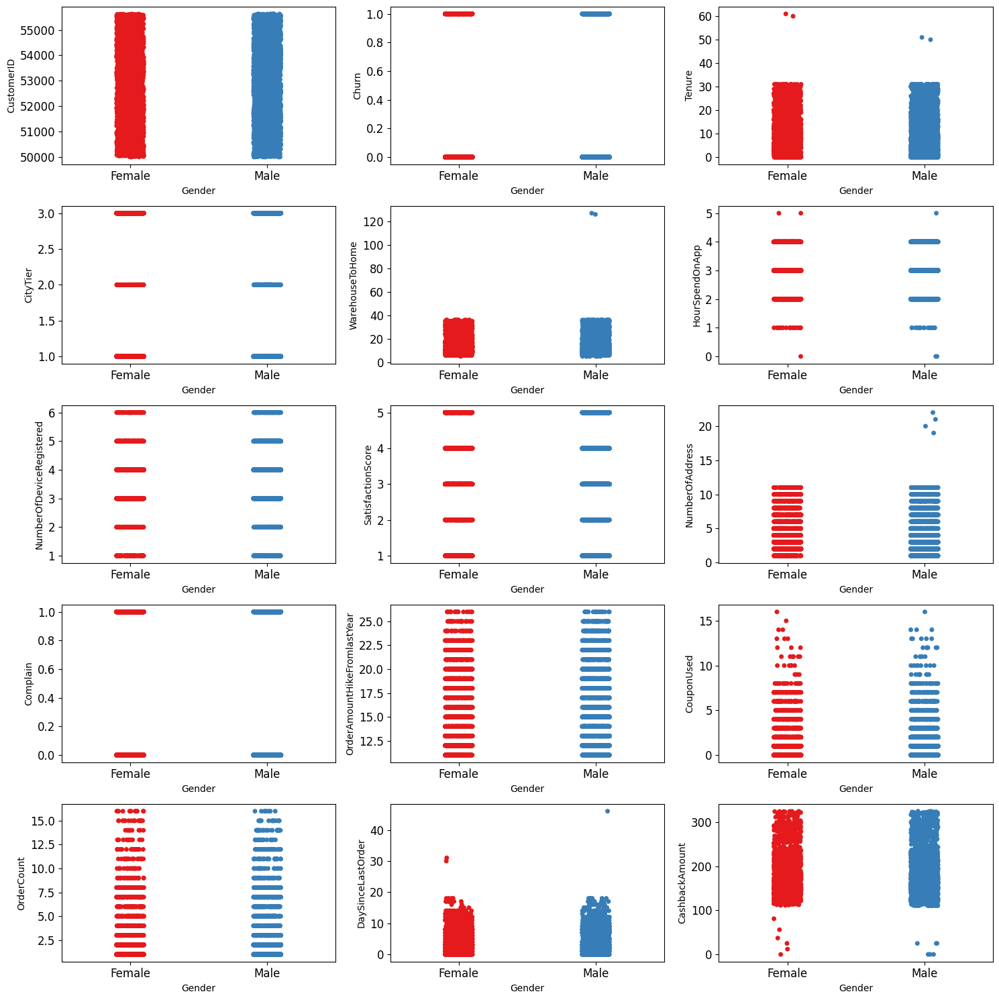

In [ ]:
#Category Plots (Categorical-Numeric)
fig = plt.figure(figsize=(15,15))
for i in range(0,len(nums[0:])):
  ax = fig.add_subplot(5, 3, i+1)
  sns.stripplot(ax=ax, data=data_e_com, x='Gender', y=nums[i], palette="Set1")
  plt.tight_layout()

Hasil Observasi Korelasi kategori gender dengan semua numerical dapat dilihat bahwa tidak ada yang berpengaruh, karena terlihat rata stripplotnya.

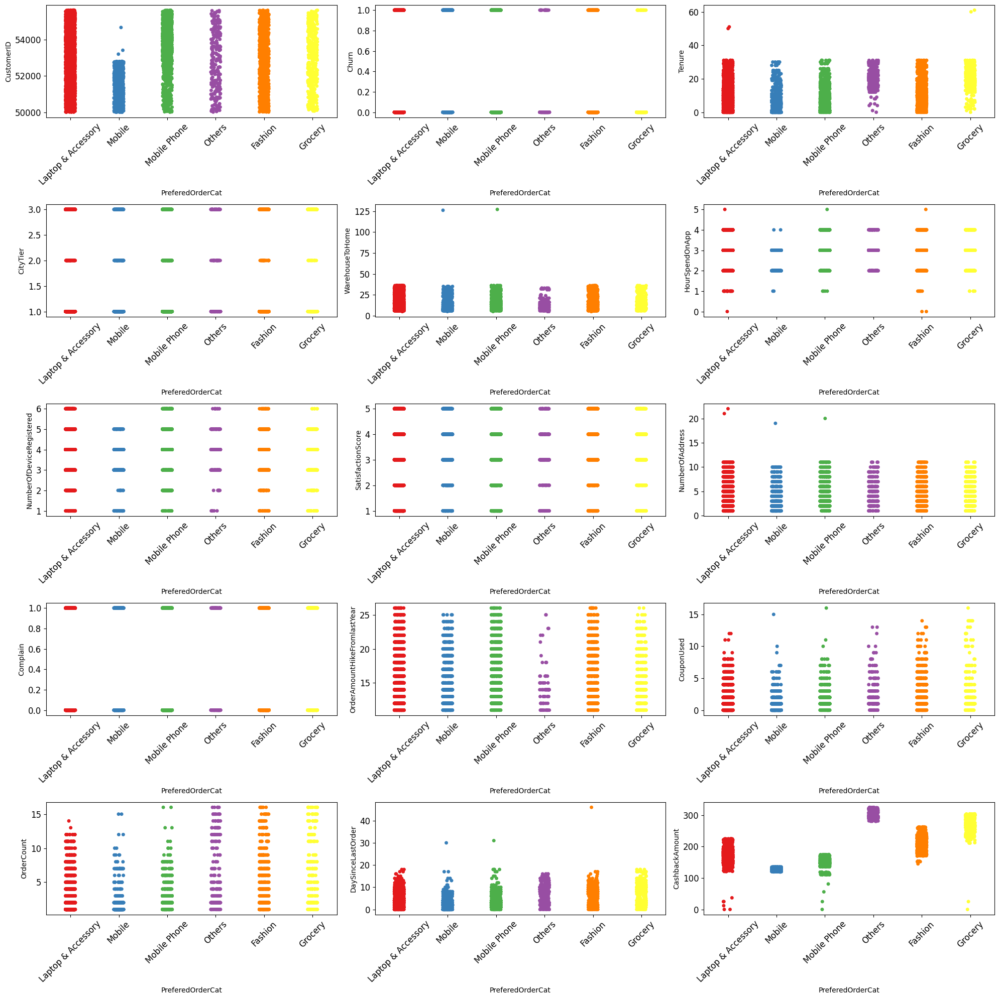

In [ ]:
#Category Plots (Categorical-Numeric)
fig = plt.figure(figsize=(20,20))
for i in range(0,len(nums[0:])):
  ax = fig.add_subplot(5, 3, i+1)
  sns.stripplot(ax=ax, data=data_e_com, x='PreferedOrderCat', y=nums[i], palette="Set1")
  plt.tick_params(axis='x', rotation=45)
  plt.tight_layout()

**Hasil Observasi** Korelasi kategori preferred order Cat dengan semua numerical dapat dilihat bahwa ada pola yang menarik pada fitur caschback amount, hal ini karena setiap prefred order cat memiliki nilai cashback amount yang bervariasi.

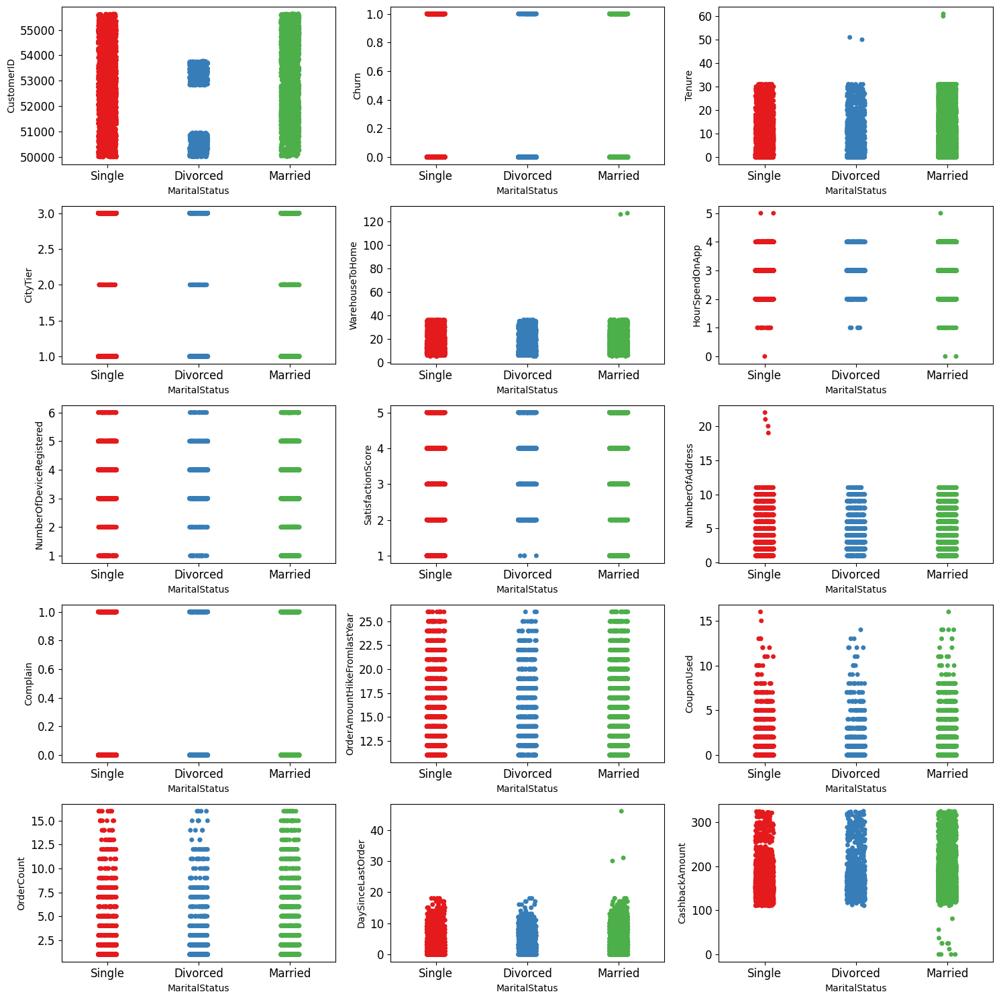

In [ ]:
#Category Plots (Categorical-Numeric) Categorical =
fig = plt.figure(figsize=(15,15))
for i in range(0,len(nums[0:])):
  ax = fig.add_subplot(5, 3, i+1)
  sns.stripplot(ax=ax, data=data_e_com, x='MaritalStatus', y=nums[i], palette="Set1")
  plt.tight_layout()

**Hasil Observasi** Korelasi kategori Marital Status dengan semua numerical dapat dilihat bahwa tidak ada yang berpengaruh, karena terlihat rata stripplotnya.

# 4. Business Insight (30 poin)
Selain EDA, lakukan juga beberapa analisis dan visualisasi untuk menemukan suatu
business insight. Tuliskan minimal 3 insight, dan berdasarkan insight tersebut jelaskan
rekomendasinya untuk bisnis

## Business Insight

#### Tenure

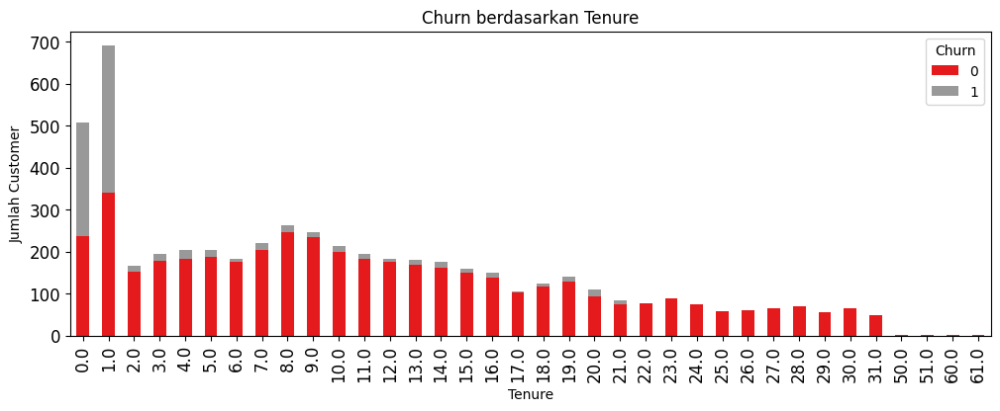

In [ ]:
tenure_churn = pd.crosstab(data_e_com["Tenure"], data_e_com["Churn"])
tenure_churn.plot(kind = 'bar', stacked = 'true', title = "Churn berdasarkan Tenure", colormap='Set1')
tenure_churn
plt.xlabel('Tenure')
plt.ylabel('Jumlah Customer')
plt.show()

Grafik batang (bar chart) "Churn berdasarkan Tenure" yang Anda tunjukkan adalah sebuah visualisasi yang memungkinkan kita untuk memahami bagaimana tingkat churn berkaitan dengan lama masa berlangganan (Tenure). Mari kita interpretasikan dan coba menyusun beberapa insight menarik dari grafik ini:

- Pola Umum: Dari grafik ini, kita dapat melihat bahwa ada variasi dalam jumlah pelanggan yang melakukan churn (tingkat churn) tergantung pada lama masa berlangganan (Tenure).

- Tenure Pendek: Pada awal-awal masa berlangganan (Tenure pendek), tingkat churn cenderung tinggi. Ini mungkin disebabkan oleh pelanggan yang mencoba layanan dan memutuskan untuk tidak melanjutkan setelah waktu singkat.

- Tenure Menengah: Pada masa berlangganan menengah, tingkat churn tampaknya menurun. Pelanggan yang telah berlangganan selama beberapa waktu cenderung lebih mungkin untuk tetap menggunakan layanan.

- Tenure Panjang: Namun, pada masa berlangganan yang sangat panjang, kita melihat sedikit peningkatan kembali dalam tingkat churn. Ini mungkin disebabkan oleh pelanggan yang akhirnya memutuskan untuk berhenti berlangganan setelah sekian lama.

- Pentingnya Masa Berlangganan: Grafik ini menunjukkan bahwa lama masa berlangganan (Tenure) adalah faktor yang signifikan dalam mempengaruhi tingkat churn. Semakin lama pelanggan menggunakan layanan, semakin rendah kemungkinan mereka untuk melakukan churn.

**Insight Bisnis:** Ini bisa menjadi wawasan berharga bagi perusahaan untuk memfokuskan upaya retensi pelanggan mereka. Perusahaan dapat mempertimbangkan strategi khusus untuk mempertahankan pelanggan pada Tenure yang lebih rendah, misalnya, dengan menawarkan promosi khusus untuk pelanggan baru.

Grafik ini dapat membantu perusahaan dalam merencanakan strategi retensi pelanggan dan memahami bagaimana lama masa berlangganan berpengaruh pada perilaku churn. Namun, untuk analisis yang lebih mendalam, diperlukan data dan model yang lebih kompleks.

## Hubungan Tenure Pendek dengan Prefered Payment Mode

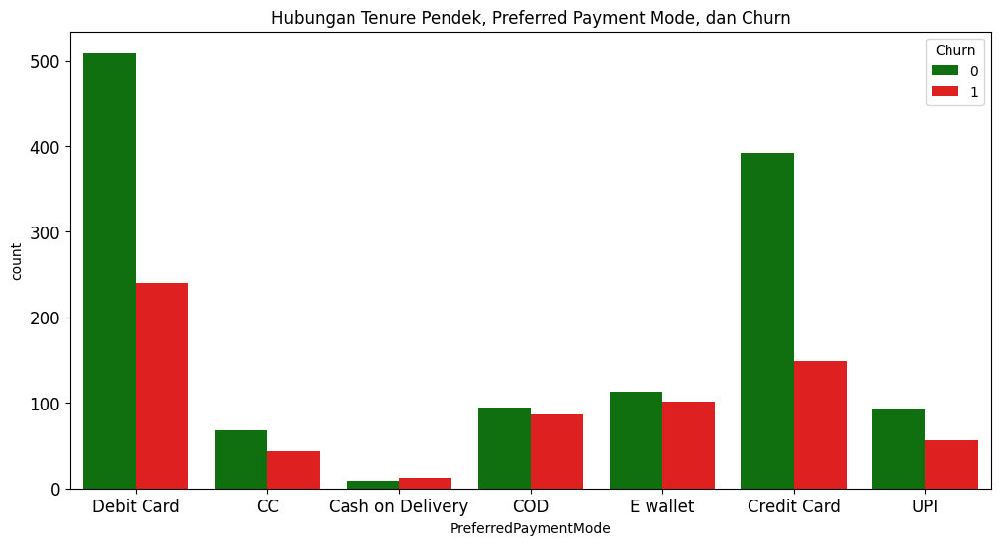

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Baca data dari file Excel
data = pd.read_excel('E Commerce Dataset (1).xlsx')

# Filter data untuk Tenure yang pendek (misalnya, Tenure kurang dari 6 bulan)
short_tenure_data = data[data['Tenure'] < 6]

# Buat plot hubungan antara Tenure yang pendek, Complain, PreferredPaymentMode, dan Churn
plt.figure(figsize=(12, 6))
sns.countplot(data=short_tenure_data, x='PreferredPaymentMode', hue='Churn', palette={0: 'g', 1: 'r'})
plt.title("Hubungan Tenure Pendek, Preferred Payment Mode, dan Churn")
plt.show()

Grafik "Hubungan Tenure Pendek, Preferred Payment Mode, dan Churn" memvisualisasikan hubungan antara pelanggan dengan Tenure (lama berlangganan) pendek (kurang dari 6 bulan) berdasarkan metode pembayaran yang mereka pilih, dengan warna berbeda untuk menunjukkan apakah mereka melakukan churn (Churn=1) atau tidak (Churn=0).

Berikut interpretasi dan insight yang dapat diperoleh dari grafik ini:


*   Preferred Payment Mode: Grafik membagi pelanggan dengan Tenure pendek ke dalam kategori metode pembayaran yang mereka pilih. Kategori metode pembayaran meliputi "Credit/Debit Card," "E-wallet," "Internet Banking," dan "UPI." Warna berbeda (hijau dan merah) menunjukkan apakah pelanggan tersebut melakukan churn atau tidak.

*   Pilihan Pembayaran dan Churn: Dalam kategori "Credit/Debit Card" dan "E-wallet," terlihat bahwa sebagian besar pelanggan dengan Tenure pendek tidak melakukan churn (ditunjukkan oleh hijau). Namun, dalam kategori "Internet Banking" dan "UPI," ada lebih banyak pelanggan yang melakukan churn (ditunjukkan oleh merah).




Insight: Dari grafik ini, terlihat bahwa metode pembayaran "Internet Banking" dan "UPI" cenderung memiliki tingkat churn yang lebih tinggi di antara pelanggan dengan Tenure pendek. Di sisi lain, metode pembayaran "Credit/Debit Card" dan "E-wallet" cenderung memiliki tingkat churn yang lebih rendah.Strategi Retensi: Perusahaan dapat menggunakan informasi ini untuk merancang strategi retensi yang lebih efektif terutama untuk pelanggan dengan Tenure pendek yang menggunakan metode pembayaran "Internet Banking" atau "UPI." Mungkin ada peluang untuk meningkatkan kualitas layanan atau menawarkan insentif tertentu kepada pelanggan dengan metode pembayaran ini.

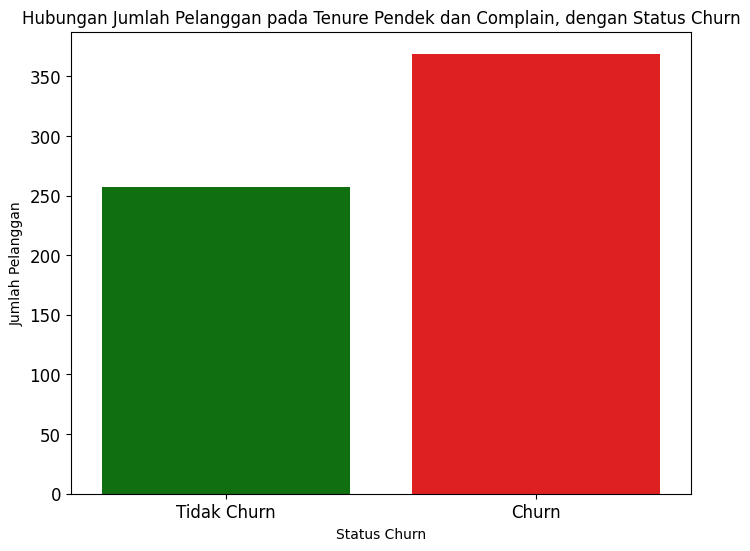

In [ ]:
short_tenure_complain_data = data[(data['Tenure'] < 6) & (data['Complain'] == 1)]

churn_counts = short_tenure_complain_data['Churn'].value_counts()
plt.figure(figsize=(8, 6))
sns.barplot(x=churn_counts.index, y=churn_counts.values, palette={0: 'g', 1: 'r'})
plt.xlabel('Status Churn')
plt.ylabel('Jumlah Pelanggan')
plt.title('Hubungan Jumlah Pelanggan pada Tenure Pendek dan Complain, dengan Status Churn')
plt.xticks([0, 1], ['Tidak Churn', 'Churn'])
plt.show()

Grafik "Hubungan Tenure Pendek, Complain, dan Churn" memvisualisasikan hubungan antara pelanggan dengan Tenure (lama berlangganan) pendek (kurang dari 6 bulan) yang mengajukan Complain (Complain=1) dengan status Churn (Churn=0 atau 1).

Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:



*   Grafik ini menggunakan diagram batang untuk menggambarkan hubungan data. Garis warna hijau dan merah menunjukkan apakah tidak churn (hijau) atau churn (merah), sedangkan sumbu x menunjukkan status churn dan sumbu y  menunjukkan status Churn.

*   Insight Pertama: Terlihat bahwa pelanggan yang termasuk dalam pelanggan yang memiliki tenure pendek dan mengajukan complain memiliki kemungkinan besar untuk churn


*   Strategi Retensi: Dengan pemahaman ini, perusahaan dapat lebih fokus pada retensi pelanggan dengan Tenure pendek yang mengajukan Complain. Mungkin perlu melakukan tindakan tambahan atau peningkatan layanan untuk mengurangi tingkat Churn di antara pelanggan ini.Grafik ini membantu mengidentifikasi korelasi antara Tenure pendek, Complain, dan Churn, sehingga dapat membantu perusahaan dalam merancang strategi retensi yang lebih efektif untuk segmen pelanggan ini.







#### Payment Mode

Text(0.5, 1.0, 'Churn Berdasarkan Metode Pembayaran')

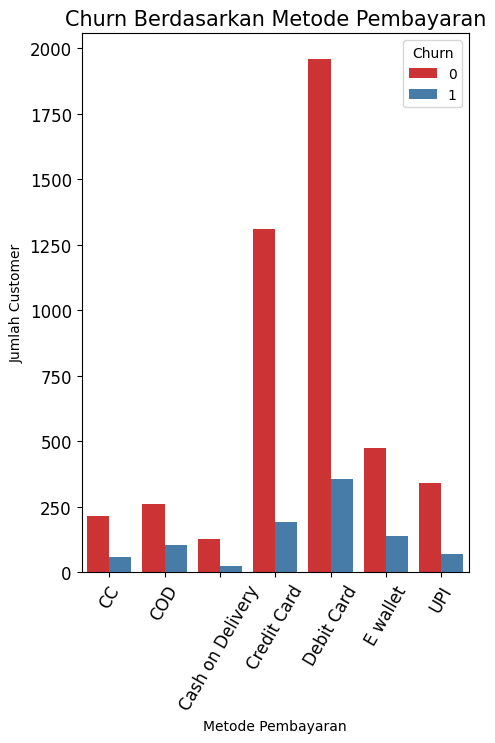

In [ ]:
payment = data_e_com.groupby(['PreferredPaymentMode','Churn']).nunique('customerID').reset_index()
fig, ax =  plt.subplots(1,1,figsize=(5,7))
bar = sns.barplot(x="PreferredPaymentMode", y="CustomerID", data=payment, hue="Churn", palette="Set1")
plt.xlabel('Metode Pembayaran')
plt.ylabel('Jumlah Customer')
plt.xticks(rotation = 60)
plt.title('Churn Berdasarkan Metode Pembayaran', fontsize=15)

Grafik batang (bar chart) "Churn Berdasarkan Metode Pembayaran" yang Anda tunjukkan adalah visualisasi yang memungkinkan kita untuk memahami bagaimana tingkat churn berkaitan dengan metode pembayaran yang digunakan oleh pelanggan. Berikut adalah beberapa interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Metode Pembayaran yang Paling Umum: Dari grafik, kita dapat melihat bahwa "Debit Card" adalah metode pembayaran yang paling umum digunakan oleh pelanggan.

- Perbandingan Churn: Grafik membandingkan tingkat churn (melambangkan warna) di antara berbagai metode pembayaran. Kita dapat melihat bahwa metode pembayaran "Credit Card" dan "Ewallet" memiliki tingkat churn yang lebih rendah dibandingkan dengan "Debit Card" dan "UPI". Ini mungkin menunjukkan bahwa pelanggan yang menggunakan "Credit Card" dan "Ewallet" cenderung lebih setia atau kurang mungkin untuk melakukan churn.

- Pentingnya Metode Pembayaran: Insight bisnis yang dapat diambil dari grafik ini adalah bahwa metode pembayaran bisa menjadi faktor penting dalam retensi pelanggan. Perusahaan dapat mempertimbangkan untuk meningkatkan penawaran atau insentif yang terkait dengan metode pembayaran dengan tingkat churn yang lebih tinggi guna mempertahankan pelanggan.

- Strategi Retensi: Grafik ini dapat membantu perusahaan merancang strategi retensi yang lebih baik dengan memahami preferensi pelanggan terkait dengan metode pembayaran. Misalnya, perusahaan dapat menawarkan insentif khusus atau program loyalitas untuk pelanggan yang memilih metode pembayaran tertentu.

- Analisis Lebih Lanjut: Selain melihat tingkat churn, perusahaan juga dapat menganalisis pendapatan yang diperoleh dari masing-masing metode pembayaran. Ini akan membantu perusahaan untuk mengambil keputusan bisnis yang lebih informasional.

#### Gender

Text(0.5, 1.0, 'Churn Berdasarkan Gender')

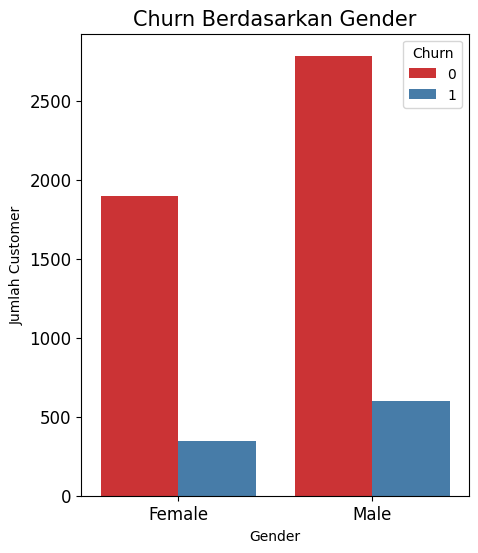

In [ ]:
gender = data_e_com.groupby(['Gender','Churn']).nunique('customerID').reset_index()
fig, ax =  plt.subplots(1,1,figsize=(5,6))
bar = sns.barplot(x="Gender", y="CustomerID", data=gender, hue="Churn", palette="Set1")
plt.xlabel('Gender')
plt.ylabel('Jumlah Customer')
plt.title('Churn Berdasarkan Gender', fontsize=15)

Text(0.5, 1.0, 'Churn Berdasarkan Gender')

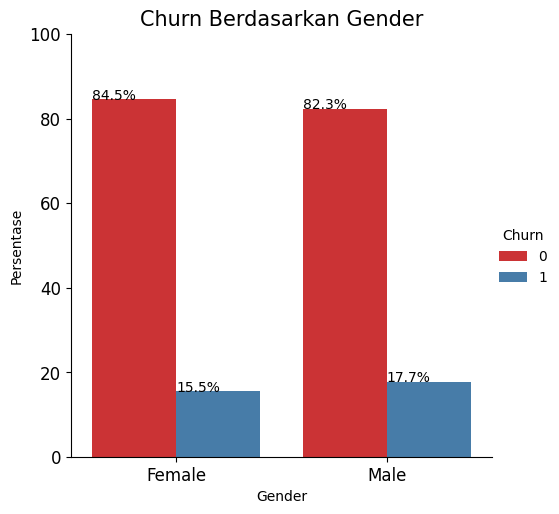

In [ ]:
new_data_e_com = data_e_com.groupby('Gender')['Churn'].value_counts(normalize=True)
new_data_e_com = new_data_e_com.mul(100).rename('Percent').reset_index()
g = sns.catplot(x='Gender', y='Percent', hue='Churn', kind='bar', data=new_data_e_com, palette="Set1")
for p in g.ax.patches:
    txt = str(p.get_height().round(1)) + '%'
    txt_x = p.get_x()
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)
g.ax.set_ylim(0,100)
plt.xlabel('Gender')
plt.ylabel('Persentase')
plt.title('Churn Berdasarkan Gender', fontsize=15)

Grafik batang (bar chart) "Churn Berdasarkan Gender" yang Anda tunjukkan adalah visualisasi yang membandingkan tingkat churn antara pelanggan berdasarkan jenis kelamin (Gender). Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Perbandingan Churn Menurut Gender: Grafik ini membandingkan tingkat churn (melambangkan warna) antara pelanggan laki-laki dan perempuan. Kita dapat melihat bahwa tidak ada perbedaan yang signifikan dalam tingkat churn antara kedua gender. Tingkat churn tampak seimbang di antara pelanggan laki-laki dan perempuan.

- Kesetaraan Gender: Insight yang dapat diambil dari grafik ini adalah bahwa jenis kelamin (gender) mungkin bukan faktor yang signifikan dalam mempengaruhi tingkat churn. Hal ini menunjukkan bahwa keputusan pelanggan untuk melakukan churn tidak terkait dengan jenis kelamin mereka.

- Pentingnya Faktor Lain: Meskipun grafik ini tidak menunjukkan perbedaan signifikan antara gender, perusahaan perlu mempertimbangkan faktor-faktor lain yang mungkin berpengaruh pada churn, seperti lama berlangganan (Tenure), metode pembayaran, atau layanan yang diberikan.

Grafik ini menunjukkan bahwa dalam konteks ini, gender mungkin bukan faktor yang signifikan dalam menggambarkan perilaku churn pelanggan. Analisis lebih lanjut dan pemahaman mendalam tentang faktor-faktor lain yang mempengaruhi churn akan menjadi langkah penting dalam merancang strategi retensi pelanggan yang efektif.

#### Hour Spend on App

Text(0.5, 1.0, 'Churn Berdasarkan Spent Hours')

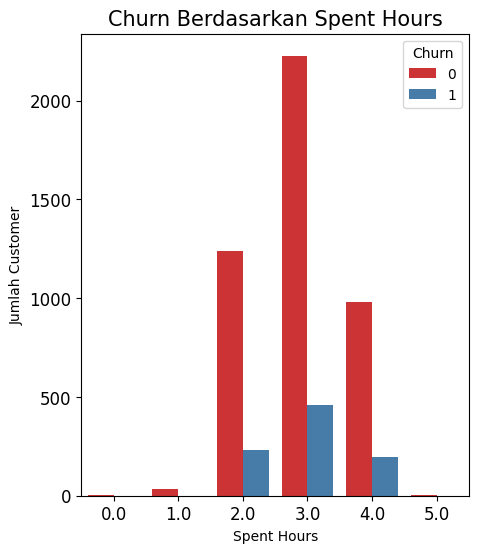

In [ ]:
hour = data_e_com.groupby(['HourSpendOnApp','Churn']).nunique('customerID').reset_index()
fig, ax =  plt.subplots(1,1,figsize=(5,6))
bar = sns.barplot(x="HourSpendOnApp", y="CustomerID", data=hour, hue="Churn", palette="Set1")
plt.xlabel('Spent Hours')
plt.ylabel('Jumlah Customer')
plt.title('Churn Berdasarkan Spent Hours', fontsize=15)

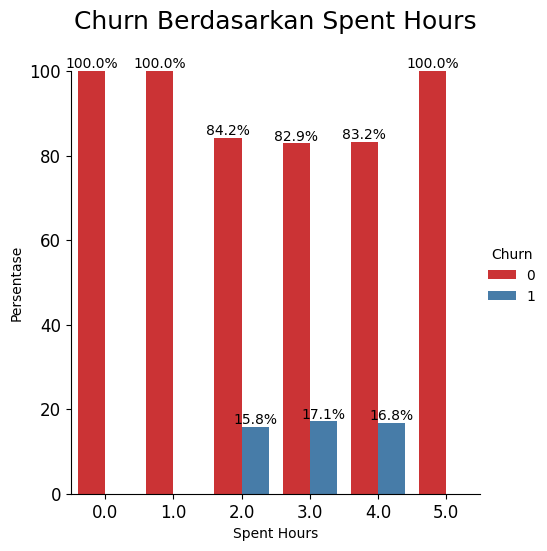

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Mengelompokkan data dan menghitung persentase Churn
new_data_e_com = data_e_com.groupby('HourSpendOnApp')['Churn'].value_counts(normalize=True)
new_data_e_com = new_data_e_com.mul(100).rename('Percent').reset_index()

# Membuat plot bar dengan label persentase pada setiap batang
g = sns.catplot(x='HourSpendOnApp', y='Percent', hue='Churn', kind='bar', data=new_data_e_com, palette="Set1")

for p in g.ax.patches:
    if not p.get_height() == 0:
        txt = f'{p.get_height():.1f}%'
        txt_x = p.get_x() + p.get_width() / 2
        txt_y = p.get_height()
        g.ax.text(txt_x, txt_y, txt, ha='center', va='bottom')

g.ax.set_ylim(0, 100)
plt.xlabel('Spent Hours')
plt.ylabel('Persentase')
plt.xticks(rotation=0)  # Mengatur rotasi label x menjadi 0

# Menambahkan teks pada lokasi tertentu pada plot
plt.text(2.5, 110, 'Churn Berdasarkan Spent Hours', fontsize=18, ha='center')

plt.show()


Grafik batang (bar chart) "Churn Berdasarkan Spent Hours" yang Anda tampilkan adalah sebuah visualisasi yang membandingkan tingkat churn (pergantian pelanggan) berdasarkan jumlah jam yang dihabiskan oleh pelanggan dalam aplikasi. Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Pengaruh Spent Hours: Grafik ini membagi pelanggan menjadi beberapa kelompok berdasarkan jumlah jam yang mereka habiskan di dalam aplikasi. Kita dapat melihat bahwa semakin lama waktu yang dihabiskan dalam aplikasi, tingkat churn cenderung menurun. Ini mengindikasikan bahwa pelanggan yang menghabiskan lebih banyak waktu dalam aplikasi cenderung lebih setia dan kurang mungkin melakukan churn.

- Segmentasi Pelanggan: Grafik ini dapat membantu perusahaan dalam segmentasi pelanggan berdasarkan perilaku penggunaan aplikasi. Perusahaan dapat memahami bahwa pelanggan dengan "Spent Hours" lebih rendah adalah lebih rentan terhadap churn, dan dengan demikian dapat mengambil tindakan yang sesuai untuk mempertahankan mereka, seperti menawarkan insentif atau promosi.

- Menarik Pelanggan Baru: Perusahaan juga dapat menggunakan wawasan ini untuk menarik pelanggan baru dan mendorong mereka untuk menghabiskan lebih banyak waktu dalam aplikasi, yang dapat membantu dalam retensi pelanggan.

- Analisis Lebih Lanjut: Grafik ini adalah langkah awal dalam memahami hubungan antara waktu yang dihabiskan dalam aplikasi dan churn. Analisis lebih lanjut mungkin diperlukan untuk memahami penyebab di balik hubungan ini, seperti mengapa pelanggan yang menghabiskan lebih banyak waktu cenderung tetap setia.

Grafik ini menyajikan informasi yang berharga dan dapat membantu perusahaan dalam merancang strategi retensi pelanggan yang lebih efektif dan menarik pelanggan baru. Dalam konteks ini, faktor "Spent Hours" tampaknya menjadi indikator penting dalam perilaku churn pelanggan.

#### Number of Device Registered

Text(0.5, 1.0, 'Churn Berdasarkan Banyaknya Device')

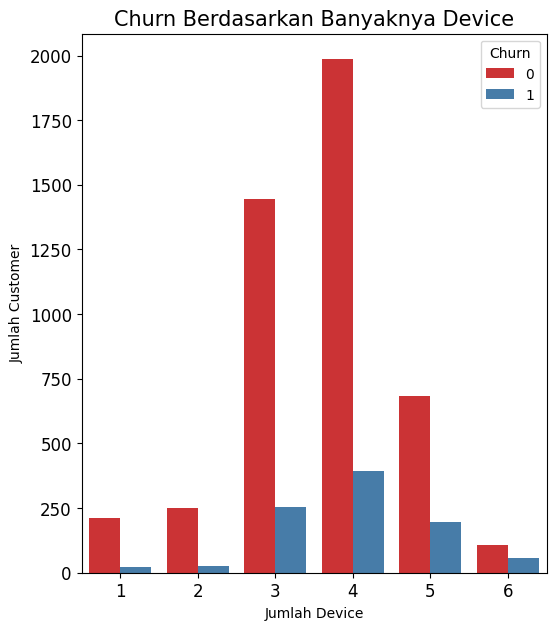

In [ ]:
device = data_e_com.groupby(['NumberOfDeviceRegistered','Churn']).nunique('customerID').reset_index()
fig, ax =  plt.subplots(1,1,figsize=(6,7))
bar = sns.barplot(x="NumberOfDeviceRegistered", y="CustomerID", data=device, hue="Churn", palette="Set1")
plt.xlabel('Jumlah Device')
plt.ylabel('Jumlah Customer')
plt.title('Churn Berdasarkan Banyaknya Device', fontsize=15)

Text(0.5, 1.0, 'Churn Berdasarkan Banyaknya Device')

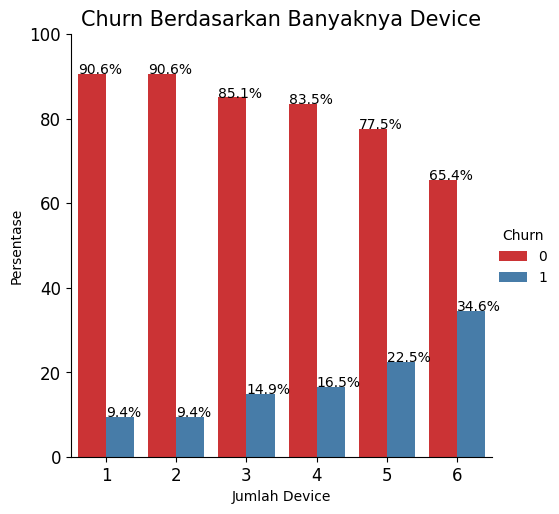

In [ ]:
new_data_e_com = data_e_com.groupby('NumberOfDeviceRegistered')['Churn'].value_counts(normalize=True)
new_data_e_com = new_data_e_com.mul(100).rename('Percent').reset_index()
g = sns.catplot(x='NumberOfDeviceRegistered', y='Percent', hue='Churn', kind='bar', data=new_data_e_com, palette="Set1")
for p in g.ax.patches:
    txt = str(p.get_height().round(1)) + '%'
    txt_x = p.get_x()
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)
g.ax.set_ylim(0,100)
plt.xlabel('Jumlah Device')
plt.ylabel('Persentase')
plt.title('Churn Berdasarkan Banyaknya Device', fontsize=15)

Grafik batang (bar chart) "Churn Berdasarkan Banyaknya Device" yang Anda tampilkan adalah visualisasi yang membandingkan tingkat churn (pergantian pelanggan) berdasarkan jumlah perangkat yang terdaftar oleh pelanggan. Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Pengaruh Jumlah Device: Grafik ini membagi pelanggan menjadi beberapa kelompok berdasarkan jumlah perangkat yang mereka daftarkan. Dari grafik, kita dapat melihat bahwa pelanggan yang hanya mendaftarkan satu perangkat memiliki tingkat churn yang relatif rendah, sementara pelanggan yang mendaftarkan dua atau lebih perangkat cenderung memiliki tingkat churn yang lebih tinggi.

- Segmentasi Pelanggan: Insight yang dapat diambil adalah bahwa ada perbedaan perilaku churn antara pelanggan dengan jumlah perangkat yang berbeda. Ini dapat membantu perusahaan dalam segmentasi pelanggan dan menyesuaikan strategi retensi berdasarkan jumlah perangkat yang terdaftar.

- Perawatan Pelanggan: Pelanggan yang mendaftarkan lebih banyak perangkat mungkin memerlukan lebih banyak perawatan atau dukungan untuk mempertahankan mereka. Perusahaan dapat mempertimbangkan untuk meningkatkan layanan pelanggan atau menawarkan insentif khusus untuk pelanggan dengan lebih dari satu perangkat.

- Analisis Lebih Lanjut: Untuk pemahaman yang lebih mendalam, perusahaan dapat melakukan analisis lebih lanjut untuk menentukan penyebab di balik perbedaan tingkat churn ini. Apakah masalah kompatibilitas, kualitas layanan, atau faktor-faktor lain yang mempengaruhi perilaku pelanggan?

Grafik ini memberikan wawasan awal tentang bagaimana jumlah perangkat yang terdaftar oleh pelanggan berhubungan dengan tingkat churn. Ini dapat membantu perusahaan dalam merancang strategi retensi pelanggan yang lebih disesuaikan dengan preferensi dan perilaku pelanggan.

#### Prefered Order Cat

Text(0.5, 1.0, 'Churn Berdasarkan Prefered Order Cat')

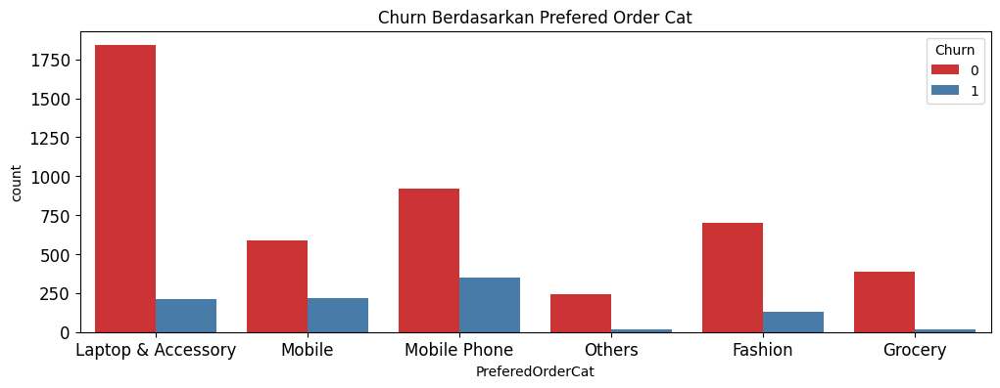

In [ ]:
sns.countplot(x='PreferedOrderCat', data=data_e_com, hue='Churn', palette="Set1")
plt.title('Churn Berdasarkan Prefered Order Cat')

Grafik "Churn Berdasarkan Prefered Order Cat" adalah sebuah grafik hitung (countplot) yang membandingkan jumlah pelanggan yang melakukan churn (tingkat churn) berdasarkan kategori pesanan yang lebih disukai (Prefered Order Cat). Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Preferensi Pesanan: Grafik ini memberikan gambaran tentang kategori pesanan yang lebih disukai oleh pelanggan, dan sejauh mana preferensi ini berhubungan dengan tingkat churn.

- Kategori Pesanan yang Paling Disukai: Dari grafik, kita dapat melihat bahwa kategori pesanan "Fashion" adalah yang paling banyak dipilih oleh pelanggan, diikuti oleh "Grocery." Kategori pesanan "Laptop & Accessories" memiliki jumlah pelanggan yang lebih sedikit.

- Tingkat Churn: Grafik ini membandingkan tingkat churn di antara berbagai kategori pesanan. Kami dapat melihat bahwa kategori pesanan "Laptop & Accessories" memiliki tingkat churn yang cukup tinggi dibandingkan dengan kategori pesanan lainnya. Ini mungkin menunjukkan bahwa pelanggan yang lebih suka kategori pesanan "Laptop & Accessories" cenderung lebih mungkin melakukan churn.

- Segmentasi Pelanggan: Grafik ini dapat membantu perusahaan dalam segmentasi pelanggan berdasarkan preferensi kategori pesanan mereka. Perusahaan dapat memahami bahwa pelanggan dengan preferensi berbeda mungkin memiliki perilaku churn yang berbeda.

- Strategi Retensi: Perusahaan dapat merancang strategi retensi yang lebih spesifik untuk kategori pesanan dengan tingkat churn yang lebih tinggi. Mereka dapat menawarkan insentif atau layanan tambahan untuk mempertahankan pelanggan dalam kategori ini.

- Analisis Lebih Lanjut: Selain melihat tingkat churn, perusahaan juga dapat melakukan analisis lebih mendalam untuk memahami faktor-faktor yang mungkin memengaruhi perilaku pelanggan dalam memilih kategori pesanan tertentu.

Grafik ini memberikan informasi yang berguna tentang bagaimana preferensi pelanggan terkait dengan kategori pesanan berhubungan dengan tingkat churn. Dengan pemahaman ini, perusahaan dapat mengambil langkah-langkah yang sesuai untuk meminimalkan churn dan mempertahankan pelanggan dengan lebih baik.

#### Satisfaction Score

Text(0.5, 1.0, 'Churn Berdasarkan Satisfaction Score')

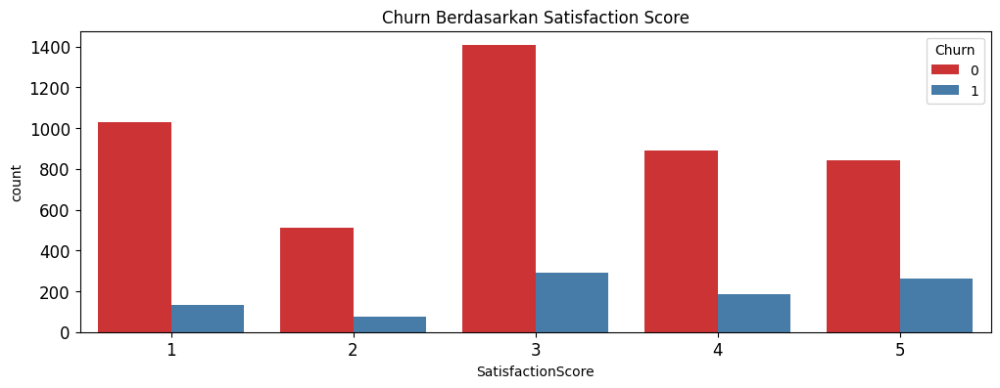

In [ ]:
sns.countplot(x='SatisfactionScore', data=data_e_com, hue='Churn', palette="Set1")
plt.title('Churn Berdasarkan Satisfaction Score')

Grafik "Churn Berdasarkan Satisfaction Score" adalah sebuah grafik hitung (countplot) yang membandingkan jumlah pelanggan yang melakukan churn (tingkat churn) berdasarkan skor kepuasan pelanggan (Satisfaction Score). Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Skor Kepuasan Pelanggan: Grafik ini memberikan gambaran tentang tingkat kepuasan pelanggan berdasarkan skor kepuasan yang diberikan. Skor kepuasan ini mungkin berasal dari survei atau umpan balik pelanggan.

- Tingkat Churn: Grafik ini membandingkan tingkat churn di antara berbagai skor kepuasan. Kami dapat melihat bahwa pelanggan dengan skor kepuasan rendah (1 atau 2) memiliki tingkat churn yang cukup tinggi, sementara pelanggan dengan skor kepuasan tinggi (4 atau 5) memiliki tingkat churn yang lebih rendah.

- Pentingnya Kepuasan Pelanggan: Grafik ini menggarisbawahi pentingnya kepuasan pelanggan dalam menjaga pelanggan tetap setia. Pelanggan yang puas dengan layanan cenderung lebih setia dan kurang mungkin melakukan churn.

- Segmentasi Pelanggan: Perusahaan dapat menggunakan informasi ini untuk segmentasi pelanggan berdasarkan tingkat kepuasan mereka. Mereka dapat memfokuskan upaya retensi pada pelanggan dengan skor kepuasan rendah, misalnya, dengan menawarkan solusi untuk meningkatkan kepuasan mereka.

- Peningkatan Layanan: Grafik ini dapat menjadi panduan bagi perusahaan untuk memperbaiki layanan mereka. Pelanggan dengan skor kepuasan rendah mungkin memiliki masalah atau keluhan tertentu yang perlu diatasi.

- Analisis Lebih Lanjut: Selain tingkat churn, perusahaan juga dapat melakukan analisis lebih mendalam untuk memahami faktor-faktor yang mempengaruhi kepuasan pelanggan dan cara meningkatkan skor kepuasan secara keseluruhan.

Grafik ini memberikan pemahaman yang kuat tentang hubungan antara kepuasan pelanggan dan tingkat churn. Dengan demikian, perusahaan dapat merancang strategi retensi pelanggan yang lebih efektif dan fokus pada meningkatkan kepuasan pelanggan.

#### Marital Status

Text(0.5, 1.0, 'Churn Berdasarkan Marital Status')

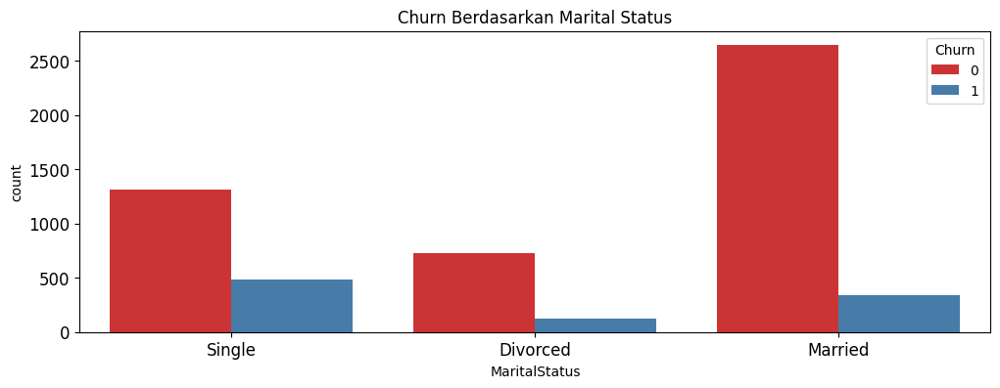

In [ ]:
sns.countplot(x='MaritalStatus', data=data_e_com, hue='Churn', palette="Set1")
plt.title('Churn Berdasarkan Marital Status')

Grafik "Churn Berdasarkan Marital Status" adalah grafik hitung (countplot) yang membandingkan jumlah pelanggan yang melakukan churn (tingkat churn) berdasarkan status perkawinan (Marital Status). Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Status Perkawinan Pelanggan: Grafik ini membagi pelanggan menjadi beberapa kategori berdasarkan status perkawinan mereka. Status perkawinan ini bisa mencakup "Married" (menikah), "Single" (belum menikah), atau kategori lainnya.

- Tingkat Churn: Grafik ini membandingkan tingkat churn di antara berbagai status perkawinan. Dari grafik, kita dapat melihat bahwa pelanggan yang memiliki status perkawinan "Married" (menikah) memiliki tingkat churn yang lebih rendah dibandingkan dengan pelanggan yang "Single" (belum menikah).

- Hubungan Status Perkawinan dengan Churn: Insight yang dapat diambil adalah bahwa status perkawinan tampaknya berhubungan dengan tingkat churn. Pelanggan yang menikah cenderung lebih setia dan kurang mungkin melakukan churn dibandingkan dengan pelanggan yang belum menikah.

- Segmentasi Pelanggan: Perusahaan dapat memanfaatkan wawasan ini untuk melakukan segmentasi pelanggan berdasarkan status perkawinan. Ini dapat membantu mereka merancang strategi retensi yang lebih disesuaikan dengan kebutuhan masing-masing kelompok.

- Peningkatan Layanan: Perusahaan juga dapat mempertimbangkan apakah ada faktor-faktor lain yang memengaruhi hubungan ini. Misalnya, apakah pelanggan yang menikah mungkin lebih puas dengan layanan atau memiliki kebutuhan yang berbeda?


Grafik ini memberikan pemahaman awal tentang bagaimana status perkawinan pelanggan berhubungan dengan tingkat churn. Untuk analisis yang lebih mendalam, perusahaan dapat menjalankan studi statistik atau analisis prediktif guna memahami faktor-faktor penyebab dan merancang strategi retensi yang lebih efektif.

#### Number Of Address

Text(0.5, 1.0, 'Churn Berdasarkan Number Of Address')

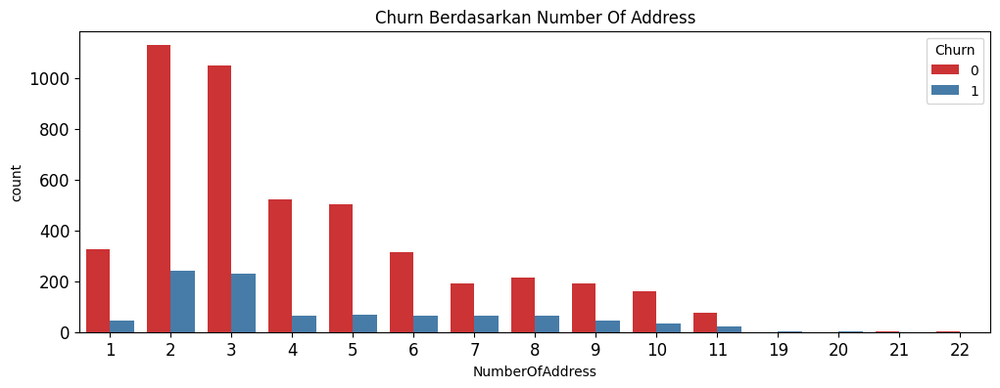

In [ ]:
sns.countplot(x='NumberOfAddress', data=data_e_com, hue='Churn', palette="Set1")
plt.title('Churn Berdasarkan Number Of Address')

Grafik "Churn Berdasarkan Number Of Address" adalah grafik hitung (countplot) yang membandingkan jumlah pelanggan yang melakukan churn (tingkat churn) berdasarkan jumlah alamat yang dimiliki oleh pelanggan (Number Of Address). Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Jumlah Alamat Pelanggan: Grafik ini membagi pelanggan menjadi beberapa kategori berdasarkan jumlah alamat yang mereka miliki. Ini mungkin mencerminkan berapa banyak alamat yang digunakan pelanggan untuk pengiriman atau alamat yang terkait dengan akun mereka.

- Tingkat Churn: Grafik ini membandingkan tingkat churn di antara berbagai jumlah alamat. Dari grafik, kita dapat melihat bahwa pelanggan dengan satu alamat memiliki tingkat churn yang lebih tinggi dibandingkan dengan pelanggan yang memiliki dua atau lebih alamat.

- Hubungan Jumlah Alamat dengan Churn: Insight yang dapat diambil adalah bahwa jumlah alamat tampaknya berhubungan dengan tingkat churn. Pelanggan dengan satu alamat cenderung memiliki tingkat churn yang lebih tinggi. Hal ini mungkin mengindikasikan bahwa pelanggan dengan lebih dari satu alamat mungkin lebih setia atau memiliki kebutuhan yang berbeda.

- Segmentasi Pelanggan: Perusahaan dapat menggunakan wawasan ini untuk melakukan segmentasi pelanggan berdasarkan jumlah alamat. Mereka dapat merancang strategi retensi yang lebih sesuai dengan kebutuhan masing-masing kelompok.

- Peningkatan Layanan: Perusahaan juga dapat mempertimbangkan apakah pelanggan dengan satu alamat memiliki masalah khusus yang perlu diatasi. Mungkin mereka menghadapi kendala dalam pengiriman atau layanan yang perlu ditingkatkan.

Grafik ini memberikan pemahaman awal tentang hubungan antara jumlah alamat pelanggan dan tingkat churn. Untuk analisis yang lebih mendalam, perusahaan dapat menjalankan studi statistik atau analisis prediktif guna memahami faktor-faktor penyebab dan merancang strategi retensi yang lebih efektif.

#### Complain

Text(0.5, 1.0, 'Churn Berdasarkan Complain')

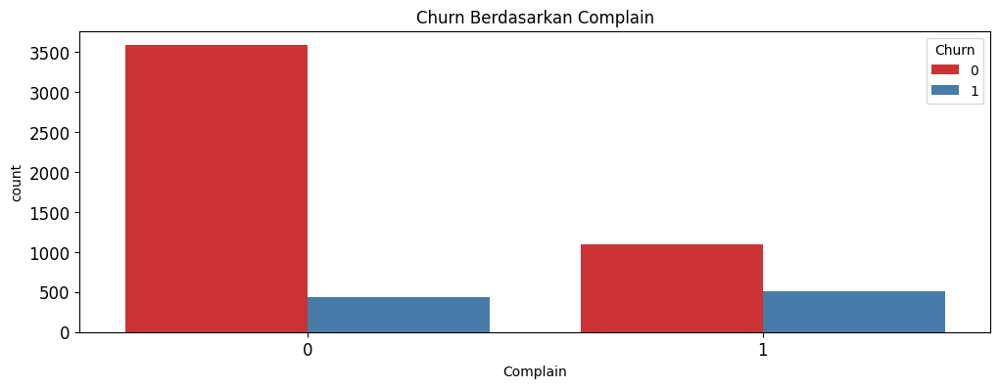

In [ ]:
sns.countplot(x='Complain', data=data_e_com, hue='Churn', palette="Set1")
plt.title('Churn Berdasarkan Complain')

Grafik "Churn Berdasarkan Complain" adalah grafik hitung (countplot) yang membandingkan jumlah pelanggan yang melakukan churn (tingkat churn) berdasarkan apakah pelanggan pernah mengajukan keluhan (Complain) atau tidak. Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Keluhan Pelanggan: Grafik ini membagi pelanggan menjadi dua kelompok, yaitu kelompok yang pernah mengajukan keluhan (Complain = 1) dan kelompok yang tidak pernah mengajukan keluhan (Complain = 0).

- Tingkat Churn: Grafik ini membandingkan tingkat churn di antara kedua kelompok tersebut. Dari grafik, kita dapat melihat bahwa pelanggan yang pernah mengajukan keluhan (Complain = 1) memiliki tingkat churn yang lebih tinggi dibandingkan dengan pelanggan yang tidak pernah mengajukan keluhan (Complain = 0).

- Hubungan Keluhan dengan Churn: Insight yang dapat diambil adalah bahwa keluhan pelanggan tampaknya berhubungan dengan tingkat churn. Pelanggan yang pernah mengajukan keluhan cenderung memiliki tingkat churn yang lebih tinggi. Ini bisa mengindikasikan bahwa keluhan yang tidak teratasi dengan baik dapat memengaruhi keputusan pelanggan untuk melakukan churn.

- Pentingnya Manajemen Keluhan: Grafik ini menekankan pentingnya manajemen keluhan pelanggan. Perusahaan perlu memastikan bahwa keluhan pelanggan ditangani dengan baik dan bahwa upaya dilakukan untuk memecahkan masalah pelanggan dengan cepat dan efisien.

- Peningkatan Layanan: Perusahaan dapat menggunakan informasi ini untuk memperbaiki layanan mereka. Mungkin ada pola atau masalah umum yang muncul dari keluhan pelanggan yang dapat diperbaiki.


Grafik ini memberikan wawasan yang jelas tentang hubungan antara keluhan pelanggan dan tingkat churn. Perusahaan dapat menggunakan informasi ini untuk meningkatkan manajemen keluhan, memperbaiki layanan, dan merancang strategi retensi pelanggan yang lebih efektif.

#### Order Amount Hike from Last Year

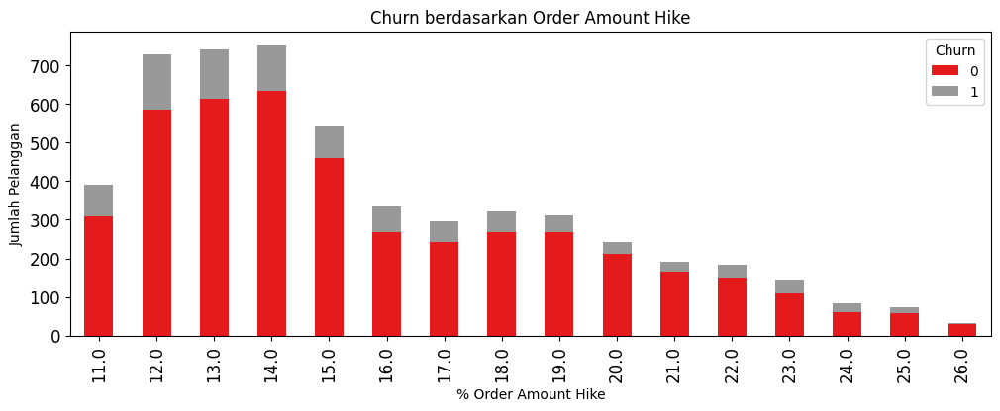

In [ ]:
OAH_churn = pd.crosstab(data_e_com["OrderAmountHikeFromlastYear"], data_e_com["Churn"])
OAH_churn.plot(kind = 'bar', stacked = 'true', title = "Churn berdasarkan Order Amount Hike", colormap='Set1')
OAH_churn
plt.xlabel('% Order Amount Hike')
plt.ylabel('Jumlah Pelanggan')
plt.show()

Grafik "Churn berdasarkan Order Amount Hike" adalah grafik batang yang membandingkan jumlah pelanggan yang melakukan churn (tingkat churn) berdasarkan kenaikan persentase order amount (Order Amount Hike) dari tahun sebelumnya. Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Kenaikan Order Amount: Grafik ini membagi pelanggan ke dalam beberapa kategori berdasarkan persentase kenaikan order amount dari tahun sebelumnya. Ini mencerminkan sejauh mana jumlah pembelian pelanggan telah meningkat dalam periode waktu tertentu.

- Tingkat Churn: Grafik ini membandingkan tingkat churn di antara berbagai kategori kenaikan order amount. Dari grafik, kita dapat melihat bahwa pelanggan dengan kenaikan order amount yang rendah (misalnya, 0-15%) memiliki tingkat churn yang lebih rendah dibandingkan dengan pelanggan dengan kenaikan order amount yang tinggi (misalnya, di atas 20%).

- Hubungan Kenaikan Order Amount dengan Churn: Insight yang dapat diambil adalah bahwa kenaikan order amount tampaknya berhubungan dengan tingkat churn. Pelanggan yang mengalami peningkatan signifikan dalam order amount mungkin lebih cenderung tetap setia, sedangkan pelanggan yang mengalami sedikit atau tidak ada peningkatan mungkin lebih cenderung melakukan churn.

- Strategi Retensi: Perusahaan dapat menggunakan informasi ini untuk merancang strategi retensi yang lebih efektif. Mungkin ada kesempatan untuk meningkatkan kenaikan order amount pelanggan dengan menawarkan insentif atau promosi yang sesuai.

Grafik ini memberikan pemahaman tentang hubungan antara kenaikan order amount dan tingkat churn. Perusahaan dapat menggunakan informasi ini untuk merancang strategi retensi yang lebih sesuai dan memahami bagaimana faktor-faktor ekonomi pelanggan berdampak pada keputusan mereka untuk tetap berlangganan.

#### Coupon Used

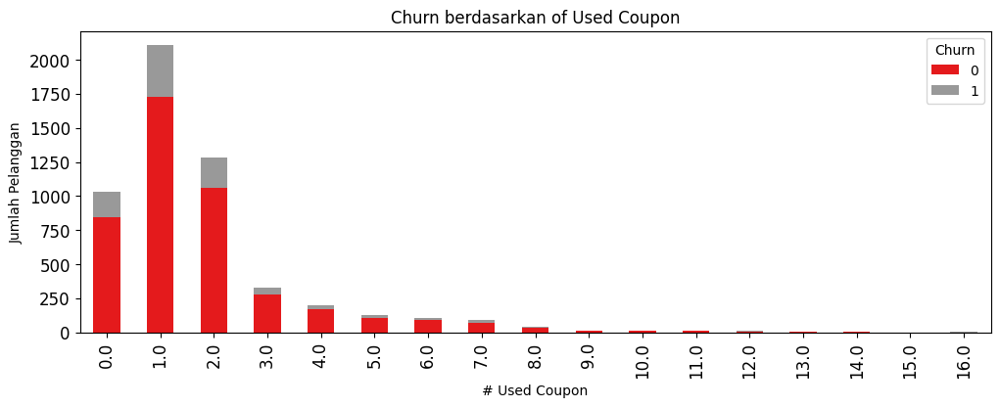

In [ ]:
CU_churn = pd.crosstab(data_e_com["CouponUsed"], data_e_com["Churn"])
CU_churn.plot(kind = 'bar', stacked = 'true', title = "Churn berdasarkan of Used Coupon", colormap='Set1')
CU_churn
plt.xlabel('# Used Coupon')
plt.ylabel('Jumlah Pelanggan')
plt.show()

Grafik "Churn berdasarkan # of Used Coupon" adalah grafik batang yang membandingkan jumlah pelanggan yang melakukan churn (tingkat churn) berdasarkan jumlah kupon yang digunakan oleh pelanggan (# of Used Coupon). Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Jumlah Kupon Digunakan: Grafik ini membagi pelanggan ke dalam beberapa kategori berdasarkan jumlah kupon yang mereka gunakan. Ini mencerminkan sejauh mana pelanggan memanfaatkan penawaran kupon yang mungkin diberikan oleh perusahaan.

- Tingkat Churn: Grafik ini membandingkan tingkat churn di antara berbagai kategori jumlah kupon yang digunakan. Dari grafik, kita dapat melihat bahwa pelanggan yang tidak menggunakan kupon (0 kupon) memiliki tingkat churn yang lebih rendah dibandingkan dengan pelanggan yang menggunakan satu atau lebih kupon.

- Hubungan Penggunaan Kupon dengan Churn: Insight yang dapat diambil adalah bahwa penggunaan kupon tampaknya berhubungan dengan tingkat churn. Pelanggan yang tidak menggunakan kupon atau hanya menggunakan sedikit kupon cenderung lebih setia, sedangkan pelanggan yang sering menggunakan kupon mungkin lebih cenderung melakukan churn.

- Strategi Retensi: Perusahaan dapat menggunakan informasi ini untuk merancang strategi retensi yang lebih efektif terkait dengan penggunaan kupon. Mungkin ada peluang untuk menargetkan pelanggan yang kurang aktif menggunakan kupon dengan penawaran yang lebih menarik.

Grafik ini memberikan pemahaman tentang hubungan antara penggunaan kupon dan tingkat churn. Perusahaan dapat menggunakan informasi ini untuk meningkatkan strategi pemasaran dan retensi pelanggan mereka, serta untuk memahami sejauh mana kupon memengaruhi perilaku pelanggan.

#### Order Count

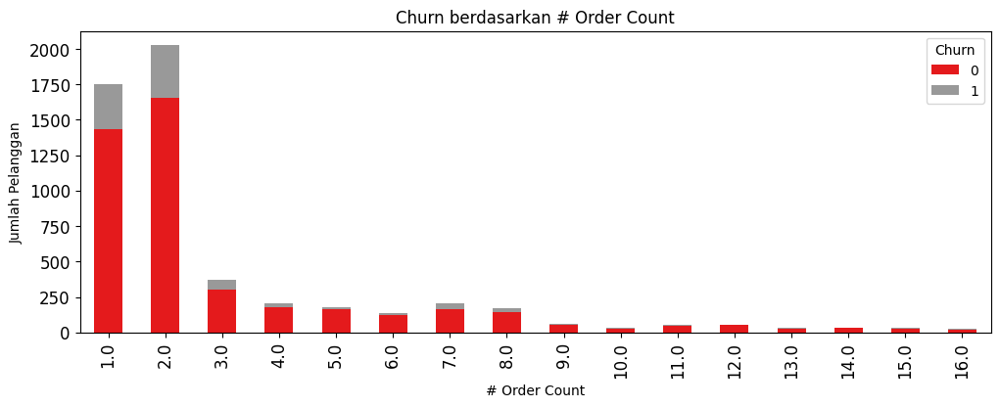

In [ ]:
OC_churn = pd.crosstab(data_e_com["OrderCount"], data_e_com["Churn"])
OC_churn.plot(kind = 'bar', stacked = 'true', title = "Churn berdasarkan # Order Count", colormap='Set1')
OC_churn
plt.xlabel('# Order Count')
plt.ylabel('Jumlah Pelanggan')
plt.show()

Grafik "Churn berdasarkan Order Count" adalah grafik batang yang membandingkan jumlah pelanggan yang melakukan churn (tingkat churn) berdasarkan jumlah pesanan yang ditempatkan oleh pelanggan (# Order Count). Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Jumlah Pesanan Pelanggan: Grafik ini membagi pelanggan menjadi beberapa kategori berdasarkan jumlah pesanan yang mereka tempatkan. Ini mencerminkan sejauh mana pelanggan aktif dalam melakukan pembelian.

- Tingkat Churn: Grafik ini membandingkan tingkat churn di antara berbagai kategori jumlah pesanan. Dari grafik, kita dapat melihat bahwa pelanggan yang telah melakukan beberapa pesanan memiliki tingkat churn yang lebih rendah dibandingkan dengan pelanggan yang hanya melakukan satu atau dua pesanan.

- Hubungan Jumlah Pesanan dengan Churn: Insight yang dapat diambil adalah bahwa jumlah pesanan tampaknya berhubungan dengan tingkat churn. Pelanggan yang aktif melakukan lebih banyak pesanan cenderung lebih setia, sedangkan pelanggan yang jarang melakukan pesanan mungkin lebih cenderung melakukan churn.

- Strategi Retensi: Perusahaan dapat menggunakan informasi ini untuk merancang strategi retensi yang lebih efektif terkait dengan keaktifan pelanggan dalam melakukan pesanan. Mungkin ada peluang untuk meningkatkan retensi pelanggan yang hanya melakukan beberapa pesanan.

Grafik ini memberikan pemahaman tentang hubungan antara jumlah pesanan pelanggan dan tingkat churn. Perusahaan dapat menggunakan informasi ini untuk meningkatkan strategi pemasaran, retensi pelanggan, dan untuk memahami sejauh mana aktivitas pesanan memengaruhi keputusan pelanggan untuk tetap berlangganan.

#### Day Since Last Order

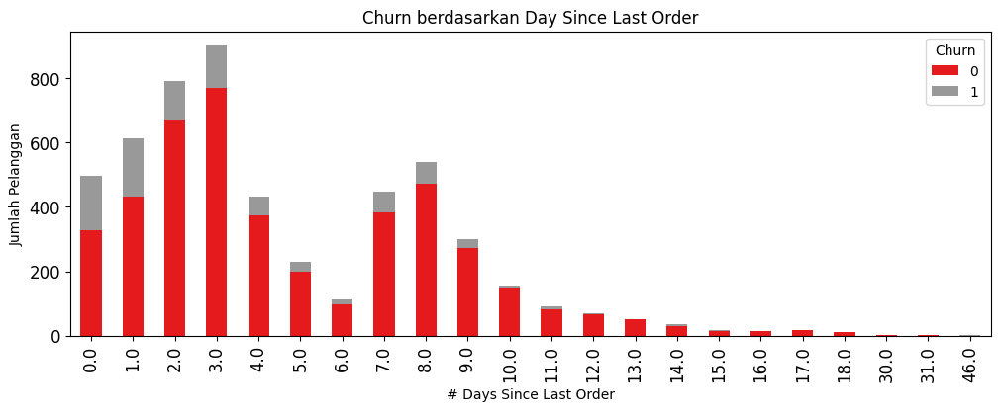

In [ ]:
DLO_churn = pd.crosstab(data_e_com["DaySinceLastOrder"], data_e_com["Churn"])
DLO_churn.plot(kind = 'bar', stacked = 'true', title = "Churn berdasarkan Day Since Last Order", colormap='Set1')
DLO_churn
plt.xlabel('# Days Since Last Order')
plt.ylabel('Jumlah Pelanggan')
plt.show()

Grafik "Churn berdasarkan Day Since Last Order" adalah grafik batang yang membandingkan jumlah pelanggan yang melakukan churn (tingkat churn) berdasarkan jumlah hari sejak pesanan terakhir yang ditempatkan oleh pelanggan (# Day Since Last Order). Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Lama Sejak Pesanan Terakhir: Grafik ini membagi pelanggan ke dalam beberapa kategori berdasarkan berapa lama sejak mereka terakhir kali melakukan pesanan. Ini mencerminkan sejauh mana pelanggan aktif dalam melakukan pembelian dan seberapa sering mereka berinteraksi dengan perusahaan.

- Tingkat Churn: Grafik ini membandingkan tingkat churn di antara berbagai kategori lama sejak pesanan terakhir. Dari grafik, kita dapat melihat bahwa pelanggan yang telah melakukan pesanan dalam beberapa hari terakhir memiliki tingkat churn yang lebih rendah dibandingkan dengan pelanggan yang telah lama tidak melakukan pesanan.

- Hubungan Lama Sejak Pesanan Terakhir dengan Churn: Insight yang dapat diambil adalah bahwa lama sejak pesanan terakhir tampaknya berhubungan dengan tingkat churn. Pelanggan yang lebih aktif dalam melakukan pesanan cenderung lebih setia, sedangkan pelanggan yang jarang melakukan pesanan mungkin lebih cenderung melakukan churn.

- Strategi Retensi: Perusahaan dapat menggunakan informasi ini untuk merancang strategi retensi yang lebih efektif terkait dengan frekuensi pesanan. Mungkin ada peluang untuk mengingatkan dan mendorong pelanggan yang sudah lama tidak melakukan pesanan.

Grafik ini memberikan pemahaman tentang hubungan antara lama sejak pesanan terakhir dan tingkat churn. Perusahaan dapat menggunakan informasi ini untuk meningkatkan strategi retensi pelanggan dan memahami bagaimana frekuensi pesanan memengaruhi keputusan pelanggan untuk tetap berlangganan.

#### Cashback Amount

In [ ]:
dfCA = data_e_com
dfCA['CashbackAmountGroup'] = np.where(dfCA['CashbackAmount']<125,'Low',
                                      np.where(dfCA['CashbackAmount']<175, 'Medium', 'High'))
dfCA.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,...,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,CashbackAmountGroup
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,...,2,Single,9,1,11.0,1.0,1.0,5.0,159.93,Medium
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,...,3,Single,7,1,15.0,0.0,1.0,0.0,120.90,Low
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,...,3,Single,6,1,14.0,0.0,1.0,3.0,120.28,Low
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,...,5,Single,8,0,23.0,0.0,1.0,3.0,134.07,Medium
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,...,5,Single,3,0,11.0,1.0,1.0,3.0,129.60,Medium


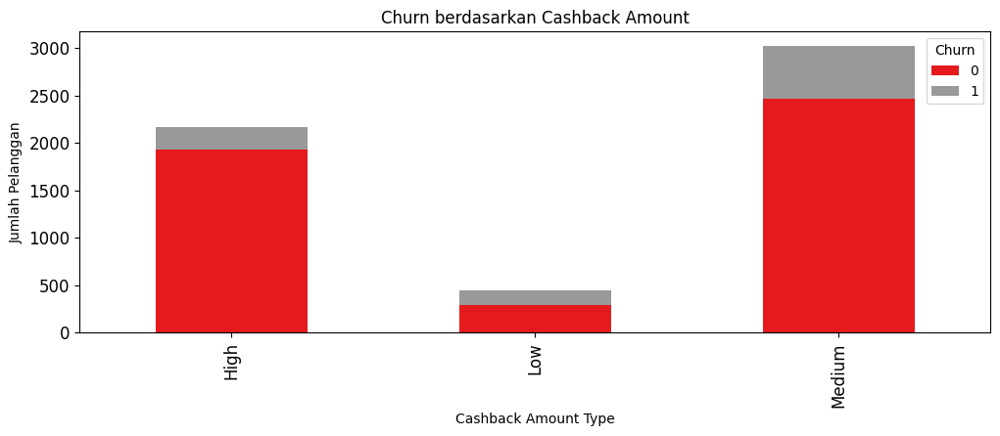

In [ ]:
DLO_CA = pd.crosstab(dfCA["CashbackAmountGroup"], dfCA["Churn"])
DLO_CA.plot(kind = 'bar', stacked = 'true', title = "Churn berdasarkan Cashback Amount", colormap='Set1')
DLO_CA
plt.xlabel('Cashback Amount Type')
plt.ylabel('Jumlah Pelanggan')
plt.show()

Grafik "Churn berdasarkan Cashback Amount" adalah grafik batang yang membandingkan jumlah pelanggan yang melakukan churn (tingkat churn) berdasarkan tipe tingkat cashback (Cashback Amount Group) yang diterima oleh pelanggan. Berikut adalah interpretasi dan insight yang dapat diperoleh dari grafik ini:

- Tingkat Cashback: Grafik ini membagi pelanggan ke dalam tiga kategori berdasarkan tingkat cashback yang mereka terima, yaitu "Low" (Rendah), "Medium" (Sedang), dan "High" (Tinggi).

- Tingkat Churn: Grafik ini membandingkan tingkat churn di antara tiga kategori tingkat cashback. Dari grafik, kita dapat melihat bahwa pelanggan dengan tingkat cashback "High" (Tinggi) memiliki tingkat churn yang lebih rendah dibandingkan dengan pelanggan dalam kategori "Low" (Rendah) dan "Medium" (Sedang).

- Hubungan Tingkat Cashback dengan Churn: Insight yang dapat diambil adalah bahwa tingkat cashback tampaknya berhubungan dengan tingkat churn. Pelanggan yang menerima tingkat cashback yang tinggi cenderung lebih setia, sedangkan pelanggan dengan tingkat cashback yang rendah atau sedang mungkin lebih cenderung melakukan churn.

- Strategi Retensi: Perusahaan dapat menggunakan informasi ini untuk merancang strategi retensi yang lebih efektif terkait dengan tingkat cashback. Mungkin ada peluang untuk meningkatkan retensi pelanggan dengan meningkatkan tingkat cashback yang ditawarkan kepada pelanggan.

Grafik ini memberikan pemahaman tentang hubungan antara tingkat cashback dan tingkat churn. Perusahaan dapat menggunakan informasi ini untuk meningkatkan strategi pemasaran, retensi pelanggan, dan untuk memahami sejauh mana tingkat cashback memengaruhi keputusan pelanggan untuk tetap berlangganan.

# 5. Git (15 poin)
Upload project teman-teman di sebuah repository git. Berkolaborasilah di Git jika ada
perubahan version dari waktu ke waktu.
- A. Buat Repository Git
- B. Upload file notebook atau file pengerjaan lainnya pada repository tersebut.

Untuk file README, dapat merupakan summary insight yang telah didapatkan dari EDA